In [1]:
include("viz.jl");

In [2]:
include("MC.jl");

ENV["COLUMNS"] = 200;
const N = 30;

In [3]:
city = "Berlin"

fn_berlin = "irradiation_Berlin.nc"
fn_berlin_w  = "irradiation_Berlin_W.nc";
fn_berlin2020 = "irradiation2020_Berlin.nc"
fn_berlin2020_w  = "irradiation2020_Berlin_W.nc";

In [4]:
test = getCMF0(fn_berlin; raw=1)[2]
test_neib_w = getCMF0(fn_berlin_w; raw=1)[2];

test2020 = getCMF1(fn_berlin2020)
test2020_neib_w = getCMF1(fn_berlin2020_w);

df01 = getDFtm(fn_berlin)
df02 = getDFtm(fn_berlin2020);

df1_train = df01[1:523007, :]
df1_test = df01[523008:end, :]
df2_train = calCMF(df1_train)

data_train = df2_train.real;

data_train_cls, binStarts, binMean = getBins(data_train, N); # city-specific

In [4]:
df2_train

,time,month,ghi,ghiCS,real
,DateTime,Int8,Float64,Float64,Float64
1,2004-02-01T07:00:00,2,0.0145616,0.0575537,0.253008
2,2004-02-01T07:15:00,2,0.601231,2.39393,0.251148
3,2004-02-01T07:30:00,2,1.60888,7.26069,0.221588
4,2004-02-01T07:45:00,2,2.45646,13.5126,0.181791
5,2004-02-01T08:00:00,2,3.08953,20.4416,0.151139
6,2004-02-01T08:15:00,2,4.5755,27.6355,0.165566
7,2004-02-01T08:30:00,2,12.0717,34.8212,0.346678
8,2004-02-01T08:45:00,2,13.2431,41.8133,0.31672
9,2004-02-01T09:00:00,2,17.6464,48.4816,0.363982


In [16]:
df2_train.year = Dates.year.(df2_train.time)

267607-element Vector{Int64}:
 2004
 2004
 2004
 2004
 2004
 2004
 2004
 2004
 2004
 2004
 2004
 2004
 2004
    ⋮
 2018
 2018
 2018
 2018
 2018
 2018
 2018
 2018
 2018
 2018
 2018
 2018

In [33]:
cmf_mo = Float64[]
gb1 = groupby(df2_train, :year);
for g_yr in gb1
    gb2 = groupby(g_yr, :month)
    mn_mo = [mean(g.real) for g in gb2]
    cmf_mo = vcat(cmf_mo, mn_mo)
end
cmf_mo

179-element Vector{Float64}:
 0.5463085513009834
 0.6120785969520348
 0.6768721863193359
 0.6326029092601944
 0.6446562095359611
 0.6661021949992791
 0.7163438373536561
 0.7092212487321142
 0.6525753801743553
 0.5226288410518823
 0.48314545731609543
 0.4508149175522489
 0.4983035814482219
 ⋮
 0.5002299213281521
 0.7291466500518442
 0.612774584912583
 0.7833514029273884
 0.8364546314387176
 0.6916781427039133
 0.8132563007302696
 0.768916537946963
 0.7380023038831182
 0.7089656709556293
 0.5811507106557517
 0.49929869519028336

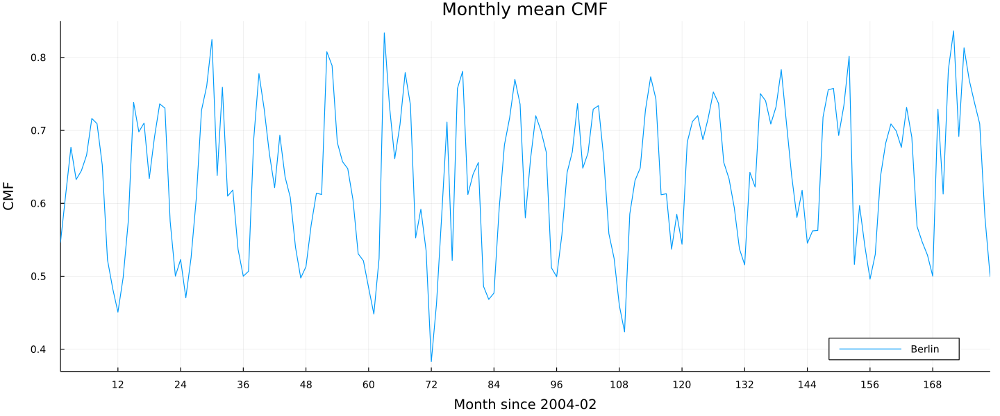

In [44]:
plot(cmf_mo, label="Berlin", leg=:bottomright, title="Monthly mean CMF",
    xticks=0:12:180, xlim=(1,179), xlabel="Month since 2004-02", ylabel="CMF", 
    leftmargin=20px, bottom_margin=20px, size=(1200, 500))

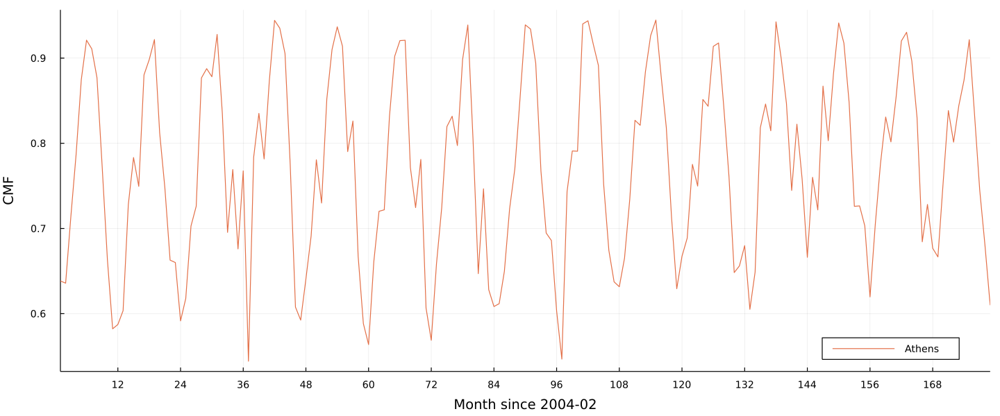

In [9]:
plot(cmf_mo, c=2, label="Athens", leg=:bottomright, #title="Monthly mean CMF",
    xticks=0:12:180, xlim=(1,179), xlabel="Month since 2004-02", ylabel="CMF", 
    leftmargin=20px, bottom_margin=20px, size=(1200, 500))

###  autocorr

In [5]:
lags = collect(0:40);

In [6]:
acf_train = autocor(data_train, lags);

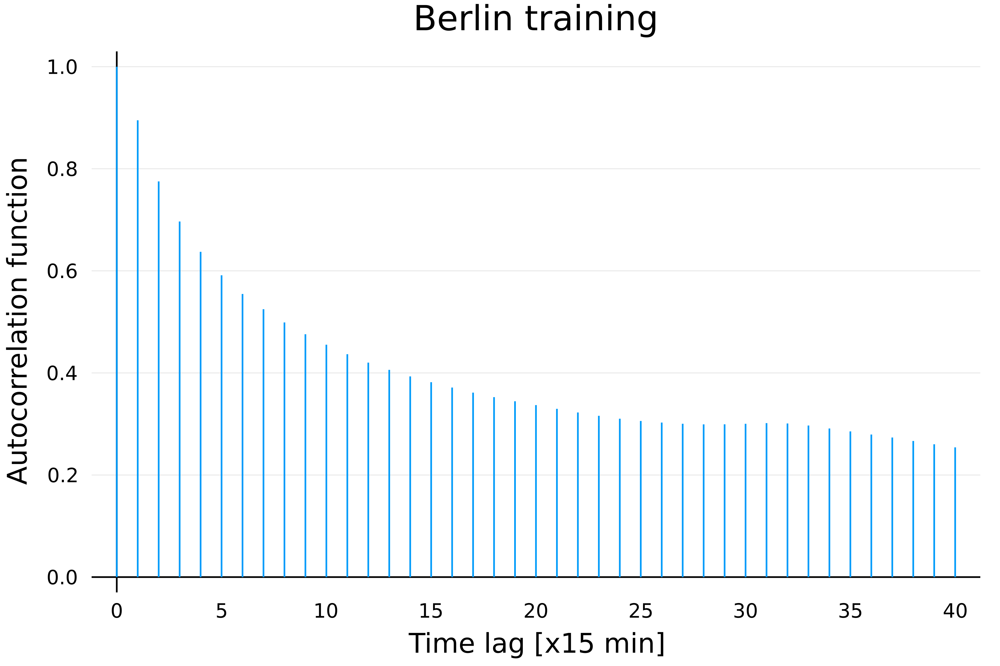

In [7]:
plot(lags, acf_train, st=:stem, frame=:zerolines, grid=:y, leg=false,
    xticks=0:5:40, yticks=-0.2:0.2:1.0,
    xlabel="Time lag [x15 min]", ylabel="Autocorrelation function", title=city*" training")

In [22]:
mn = mean(data_train)
sd = std(data_train)
@show rd.([mn, sd], 3);

rd.([mn, sd], 3) = [0.656, 0.267]


In [20]:
dt0 = data_train[1:end-1]
dt1 = data_train[2:end]
dif = rd(meanad(dt0, dt1), 3)

0.067

In [21]:
std(dt1 .- dt0)

0.12218534157592044

### time homogeneity

In [37]:
rep(arr) = replace(arr, NaN=>0, Inf=>0, -Inf=>0)

rep (generic function with 1 method)

In [235]:
n = 10;

In [244]:
n = 30;

In [236]:
od = 1;

In [252]:
od = 2;

In [253]:
state, len = getBin(data_train, n);

T1 = zeros(n^od, n); # transition maxtrix
for i in 2:len
    T1[ state[i-1], state[i] ] += 1 # count occurrence
end
T1 # counts

T2 = mcFit(state, od, n) # probs

900×30 Matrix{Float64}:
 0.594484     0.208163    0.0745434  0.0428625   0.0277674    0.0128587    0.00745434  0.00503168  …  0.0         0.0         0.000186359  0.0         0.0         0.0         0.000186359
 0.116517     0.35015     0.193994   0.0960961   0.0576577    0.0414414    0.036036    0.0102102      0.0         0.0         0.0          0.0         0.0         0.0         0.0
 0.0150754    0.120603    0.184255   0.237856    0.197655     0.078727     0.040201    0.0201005      0.0         0.0         0.0          0.0         0.0         0.0         0.0
 0.0          0.0604396   0.0879121  0.153846    0.184066     0.228022     0.112637    0.0549451      0.0         0.0         0.0          0.0         0.0         0.0         0.0
 0.0          0.0801688   0.0632911  0.0759494   0.0970464    0.172996     0.151899    0.122363       0.0         0.0         0.0          0.0         0.0         0.0         0.0
 0.0          0.0         0.0583333  0.0666667   0.075        0.116667   

#### 4 seasons

In [167]:
df1 = filter(:month => in([12, 1, 2]), df2_train)

,time,month,ghi,ghiCS,real
,DateTime,Int8,Float64,Float64,Float64
1,2004-02-01T07:00:00,2,0.0145616,0.0575537,0.253008
2,2004-02-01T07:15:00,2,0.601231,2.39393,0.251148
3,2004-02-01T07:30:00,2,1.60888,7.26069,0.221588
4,2004-02-01T07:45:00,2,2.45646,13.5126,0.181791
5,2004-02-01T08:00:00,2,3.08953,20.4416,0.151139
6,2004-02-01T08:15:00,2,4.5755,27.6355,0.165566
7,2004-02-01T08:30:00,2,12.0717,34.8212,0.346678
8,2004-02-01T08:45:00,2,13.2431,41.8133,0.31672
9,2004-02-01T09:00:00,2,17.6464,48.4816,0.363982


In [180]:
df2 = filter(:month => in([3, 4, 5]), df2_train)

,time,month,ghi,ghiCS,real
,DateTime,Int8,Float64,Float64,Float64
1,2004-03-01T06:15:00,3,1.51362,2.2292,0.678999
2,2004-03-01T06:30:00,3,6.95737,8.44246,0.824093
3,2004-03-01T06:45:00,3,15.9945,16.5806,0.964649
4,2004-03-01T07:00:00,3,25.3232,25.6707,0.986462
5,2004-03-01T07:15:00,3,33.849,35.1797,0.962174
6,2004-03-01T07:30:00,3,36.4135,44.797,0.812856
7,2004-03-01T07:45:00,3,48.0156,54.3262,0.883838
8,2004-03-01T08:00:00,3,59.8236,63.6309,0.940166
9,2004-03-01T08:15:00,3,68.6084,72.6071,0.944928


In [181]:
df3 = filter(:month => in([6, 7, 8]), df2_train)

,time,month,ghi,ghiCS,real
,DateTime,Int8,Float64,Float64,Float64
1,2004-06-01T03:00:00,6,0.00580536,0.0192772,0.301151
2,2004-06-01T03:15:00,6,0.45983,1.52691,0.301151
3,2004-06-01T03:30:00,6,1.56795,4.87277,0.321779
4,2004-06-01T03:45:00,6,6.72113,9.4194,0.713541
5,2004-06-01T04:00:00,6,12.3941,15.0652,0.822697
6,2004-06-01T04:15:00,6,14.1527,21.6914,0.652455
7,2004-06-01T04:30:00,6,18.3958,29.1695,0.630652
8,2004-06-01T04:45:00,6,25.6299,37.3668,0.685902
9,2004-06-01T05:00:00,6,30.6487,46.1526,0.664072


In [182]:
df4 = filter(:month => in([9, 10, 11]), df2_train)

,time,month,ghi,ghiCS,real
,DateTime,Int8,Float64,Float64,Float64
1,2004-09-01T04:30:00,9,0.0765924,0.175222,0.437115
2,2004-09-01T04:45:00,9,1.34066,3.10349,0.431985
3,2004-09-01T05:00:00,9,3.23962,8.62812,0.375473
4,2004-09-01T05:15:00,9,13.0164,15.8438,0.82155
5,2004-09-01T05:30:00,9,23.8018,24.2656,0.980884
6,2004-09-01T05:45:00,9,32.3736,33.5026,0.966301
7,2004-09-01T06:00:00,9,41.1201,43.2548,0.950649
8,2004-09-01T06:15:00,9,50.6335,53.3087,0.949816
9,2004-09-01T06:30:00,9,60.4295,63.4982,0.951672


In [217]:
function chi_square(df, od)
    state1, len1 = getBin(df.real, n);
    T = zeros(n^od, n); 

    if od == 1    
        for i in 2:len1
            T[ state1[i-1], state1[i] ] += 1 
        end
    elseif od == 2
        for i in 2:len1-1 
            T[ n*(state1[i-1]-1) + state1[i], state1[i+1] ] += 1
        end
    end

    T_n = mcFit(state1, od, n) 
    N_ = sum(T_n .> 0)
    m = T .* ((T_n .- T2) .^2  ./ T2)
    chi = sum(rep(m))
    return N_, chi
end

chi_square (generic function with 2 methods)

##### 1.od, 10 cls

In [238]:
N1, chi1 = chi_square(df1, 1) # Dec, Jan, Feb

(97, 4383.091387166618)

In [239]:
N2, chi2 = chi_square(df2, 1) # Mar, Apr, May

(99, 98.01930537653747)

In [240]:
N3, chi3 = chi_square(df3, 1) # Jun, Jul, Aug

(100, 422.32424245297074)

In [241]:
N4, chi4 = chi_square(df4, 1) # Sep, Oct, Nov

(89, 200.77120265711176)

In [242]:
DoF = sum([N1, N2, N3, N4])

385

In [243]:
chi_sq = sum([chi1, chi2, chi3, chi4])

5104.206137653238

##### 1.od, 30 cls

In [246]:
N1, chi1 = chi_square(df1, 1) # Dec, Jan, Feb

(780, 2140.0393535933244)

In [247]:
N2, chi2 = chi_square(df2, 1) # Mar, Apr, May

(754, 622.5908542671191)

In [248]:
N3, chi3 = chi_square(df3, 1) # Jun, Jul, Aug

(785, 1368.8263390109757)

In [249]:
N4, chi4 = chi_square(df4, 1) # Sep, Oct, Nov

(668, 648.6506871763276)

In [250]:
DoF = sum([N1, N2, N3, N4])

2987

In [251]:
chi_sq = sum([chi1, chi2, chi3, chi4])

4780.107234047747

##### 2.od, 30 cls

In [254]:
N1, chi1 = chi_square(df1, 2) # Dec, Jan, Feb

(8104, 5962.377872918822)

In [255]:
N2, chi2 = chi_square(df2, 2) # Mar, Apr, May

(7299, 6001.251761365047)

In [256]:
N3, chi3 = chi_square(df3, 2) # Jun, Jul, Aug

(8369, 16108.83601654877)

In [257]:
N4, chi4 = chi_square(df4, 2) # Sep, Oct, Nov

(6022, 6094.961277021863)

In [258]:
DoF = sum([N1, N2, N3, N4])

29794

In [259]:
chi_sq = sum([chi1, chi2, chi3, chi4])

34167.426927854496

#### half years

In [5]:
dfA = filter(:month => <=(6), df2_train)

,time,month,ghi,ghiCS,real
,DateTime,Int8,Float64,Float64,Float64
1,2004-02-01T07:00:00,2,0.0145616,0.0575537,0.253008
2,2004-02-01T07:15:00,2,0.601231,2.39393,0.251148
3,2004-02-01T07:30:00,2,1.60888,7.26069,0.221588
4,2004-02-01T07:45:00,2,2.45646,13.5126,0.181791
5,2004-02-01T08:00:00,2,3.08953,20.4416,0.151139
6,2004-02-01T08:15:00,2,4.5755,27.6355,0.165566
7,2004-02-01T08:30:00,2,12.0717,34.8212,0.346678
8,2004-02-01T08:45:00,2,13.2431,41.8133,0.31672
9,2004-02-01T09:00:00,2,17.6464,48.4816,0.363982


In [18]:
dfB = filter(:month => >(6), df2_train)

,time,month,ghi,ghiCS,real
,DateTime,Int8,Float64,Float64,Float64
1,2004-07-01T03:00:00,7,0.0224376,0.0500443,0.448354
2,2004-07-01T03:15:00,7,0.772246,1.76542,0.43743
3,2004-07-01T03:30:00,7,1.55145,5.24176,0.295978
4,2004-07-01T03:45:00,7,7.06036,9.92026,0.711711
5,2004-07-01T04:00:00,7,13.3354,15.6663,0.851218
6,2004-07-01T04:15:00,7,17.0737,22.332,0.764539
7,2004-07-01T04:30:00,7,20.7408,29.7693,0.696716
8,2004-07-01T04:45:00,7,26.4408,37.8387,0.698777
9,2004-07-01T05:00:00,7,32.6301,46.4125,0.703045


#### alt stat

In [44]:
mA = T_A .* log.(T_An ./ T2)

30×30 Matrix{Float64}:
 -116.862     -60.5514      12.337      10.1356    13.853      27.2475      28.7901      2.58498   …   NaN          NaN         NaN          NaN          NaN           NaN             0.6654
   12.1755     25.676      -42.1727    -16.4128     2.82244    10.4512      -4.66215    22.0912          1.33058    NaN         NaN           -0.0278594  NaN            -0.0278594    -1.29997
  129.469      31.7512     -86.34      -61.1454   -20.0721     11.6574      14.7126      0.624115        0.519645     3.21226    -0.0278594  NaN          NaN           NaN             2.46907
   51.275     -12.9385      63.7174    -49.4472   -61.4901      6.37995     -1.47872    14.3274          1.64517      2.66202    Inf         NaN            0.520081      1.76945       7.72134
   36.8019     10.8944       6.30536    71.3095   -43.5851    -68.4856      16.0633     15.3571         -0.0278594    3.53715    -0.0278594  NaN          NaN            -0.0278594     1.76858
   13.7349     32.

In [45]:
sum(rep(mA))

1561.0170284630176

In [49]:
mB = T_B .* log.(T_Bn ./ T2)

30×30 Matrix{Float64}:
  39.786     130.68         1.90475   -25.5566    -11.4994    -17.3623     -7.40538    -8.05294   …  NaN          NaN            0.721686   NaN          NaN           NaN         NaN
  45.1129    -63.23        22.5739     24.7005     18.0        -9.5029    -11.2059     -5.3359       NaN          NaN          NaN          NaN          NaN           NaN          -1.56454
 -48.7466    -57.6841      61.9568     88.6206    -14.2416    -16.5921     -0.913096  -10.5196       NaN          NaN            1.44315    NaN            4.03703      Inf          4.4471
 -34.4155     -5.69781    -49.7329     71.5574     85.1661      3.77625   -12.086     -16.1962        -0.376478     0.0573157  NaN          NaN           -0.376807     -0.887633   -3.25914
  -9.91645   -16.1716     -16.8411    -72.9459     31.5143     70.221      13.3958    -16.1274       NaN           -1.4472     NaN          NaN           Inf          NaN          -0.887864
 -18.2389    -14.4377       2.1079    

In [50]:
sum(rep(mB))

1717.4093796029883

### log-likelihood

In [7]:
function getBin(data, n)
    len = length(data)
    binStarts = quantile(data, 0:(1/n):1-(1/n))
    state = [findlast(data[i] .>= binStarts) for i in 1:len]
    return state, len
end

getBin (generic function with 1 method)

In [30]:
function calcLL(od, n) # log-likelihood    
    T = zeros(n^od, n); # transition maxtrix
    if od == 1
        for i in 2:len
            T[ state[i-1], state[i] ] += 1 # count occurrence
        end
    elseif od == 2
        for i in 2:len-1 
            T[ n*(state[i-1]-1) + state[i], state[i+1] ] += 1
        end
    elseif od == 3
        for i in 2:len-2
            T[ (n^2*(state[i-1]-1) + n*(state[i]-1)) + state[i+1], state[i+2] ] += 1
        end
    end
    T2 = mcFit(state, od, n) # normalized transition matrix
    TT = replace(T .* log.(T2), NaN=>0)
    LL = sum(TT)
    return LL
end

calcLL (generic function with 1 method)

In [41]:
aic(od, n, LL) = -2LL + 2 * n^od * (n-1)

aic (generic function with 1 method)

In [42]:
bic(od, n, LL) = -2LL + n^od * (n-1) * log(len)

bic (generic function with 1 method)

n = 10

In [33]:
n = 10
state, len = getBin(data_train, n);

In [48]:
od = 1
LL = calcLL(od, n)
println("LL = ", rd(LL, 0))

AIC = aic(od, n, LL)
println("AIC = ", rd(AIC, 0))

BIC = bic(od, n, LL)
println("BIC = ", rd(BIC, 0))

LL = -351322.0
AIC = 702825.0
BIC = 703769.0


In [49]:
od = 2
LL = calcLL(od, n)
println("LL = ", rd(LL, 0))

AIC = aic(od, n, LL)
println("AIC = ", rd(AIC, 0))

BIC = bic(od, n, LL)
println("BIC = ", rd(BIC, 0))

LL = -334347.0
AIC = 670494.0
BIC = 679942.0


In [50]:
od = 3
LL = calcLL(od, n)
println("LL = ", rd(LL, 0))

AIC = aic(od, n, LL)
println("AIC = ", rd(AIC, 0))

BIC = bic(od, n, LL)
println("BIC = ", rd(BIC, 0))

LL = -322391.0
AIC = 662783.0
BIC = 757258.0


n = 30

In [55]:
n = 30
state, len = getBin(data_train, n);

In [56]:
od = 1
LL = calcLL(od, n)
println("LL = ", rd(LL, 0))

AIC = aic(od, n, LL)
println("AIC = ", rd(AIC, 0))

BIC = bic(od, n, LL)
println("BIC = ", rd(BIC, 0))

LL = -593998.0
AIC = 1.189736e6
BIC = 1.198869e6


In [57]:
od = 2
LL = calcLL(od, n)
println("LL = ", rd(LL, 0))

AIC = aic(od, n, LL)
println("AIC = ", rd(AIC, 0))

BIC = bic(od, n, LL)
println("BIC = ", rd(BIC, 0))

LL = -535226.0
AIC = 1.122652e6
BIC = 1.396631e6


In [58]:
od = 3
LL = calcLL(od, n)
println("LL = ", rd(LL, 0))

AIC = aic(od, n, LL)
println("AIC = ", rd(AIC, 0))

BIC = bic(od, n, LL)
println("BIC = ", rd(BIC, 0))

LL = -455599.0
AIC = 2.477199e6
BIC = 1.0696565e7


### compute DFs

In [5]:
df21 = getDF(2, 1)

df22 = getDF(2, 2)
df23 = getDF(2, 3)
df24 = getDF(2, 4);

df21_2020 = getDF(2, 1; df_test=df02, d_test=test2020, d_neib=test2020_neib_w)

df22_2020 = getDF(2, 2; df_test=df02, d_test=test2020, d_neib=test2020_neib_w)
df23_2020 = getDF(2, 3; df_test=df02, d_test=test2020, d_neib=test2020_neib_w)
df24_2020 = getDF(2, 4; df_test=df02, d_test=test2020, d_neib=test2020_neib_w);

df1t = hybrid(df21, df21_2020, 1) # df test 2020 include all difs

df2t = hybrid(df22, df22_2020, 2)
df3t = hybrid(df23, df23_2020, 3)
df4t = hybrid(df24, df24_2020, 4);

### std 
#### by num of class

In [36]:
function std_nc(nc, steps)
    data_train_cls, binStarts, binMean = getBins(data_train, nc) 
    println(length(binStarts))
    df = getDF(2, steps; n=nc, data_train_cls=data_train_cls, binStarts=binStarts, binMean=binMean)
    df_2020 = getDF(2, steps; n=nc, data_train_cls=data_train_cls, binStarts=binStarts, binMean=binMean,
        df_test=df02, d_test=test2020, d_neib=test2020_neib_w) 
    return std(df_2020.dif_pred)
end

std_nc (generic function with 1 method)

In [37]:
stds1 = []
stds2 = []
stds3 = []
stds4 = []
for n in 5:5:40
    st1 = std_nc(n, 1)
    st2 = std_nc(n, 2)
    st3 = std_nc(n, 3)
    st4 = std_nc(n, 4)
    push!(stds1, st1)
    push!(stds2, st2)
    push!(stds3, st3)
    push!(stds4, st4)
end

6
6
6
6
11
11
11
11
16
16
16
16
21
21
21
21
26
26
26
26
31
31
31
31
36
36
36
36
41
41
41
41


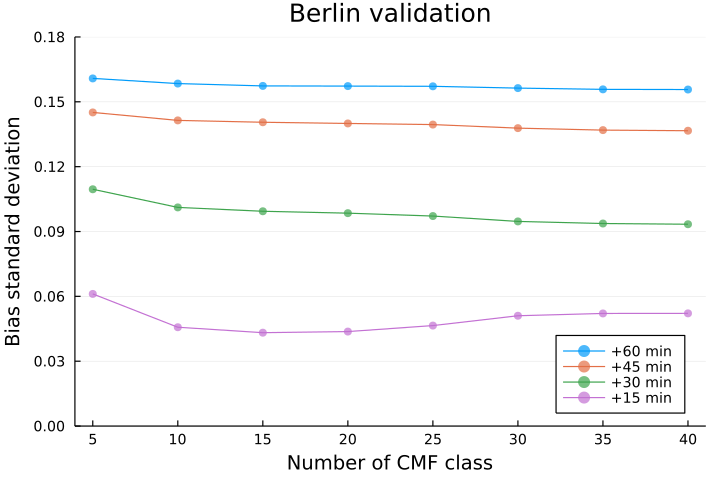

In [35]:
plot(5:5:40, [stds4 stds3 stds2 stds1], marker=(0.7, stroke(0)), ylim=(0,0.18), grid=:y,
    lab=["+60 min" "+45 min" "+30 min" "+15 min"], leg=:bottomright, 
    xticks=5:5:40, xlabel="Number of CMF class", ylabel="Bias standard deviation", title=city*" validation")

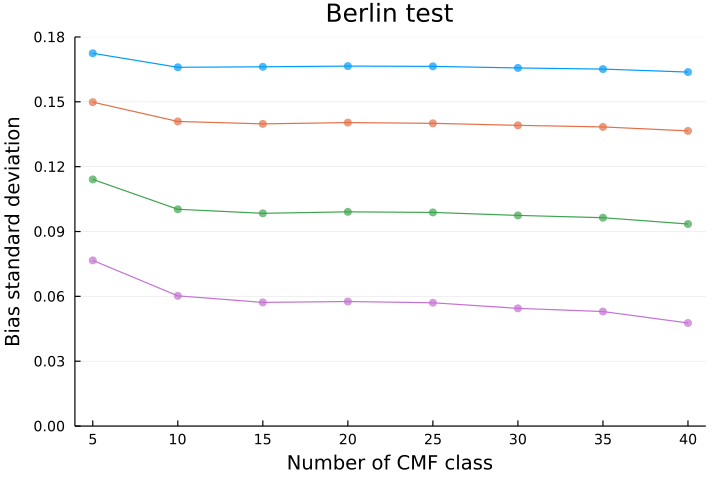

In [39]:
plot(5:5:40, [stds4 stds3 stds2 stds1], marker=(0.7, stroke(0)), ylim=(0,0.18), grid=:y,
    lab=["+60 min" "+45 min" "+30 min" "+15 min"], leg=:none, 
    xticks=5:5:40, xlabel="Number of CMF class", ylabel="Bias standard deviation", title=city*" test")

#### by order

In [281]:
std1od = []
std2od = []
std3od = []
for st in 1:4
    df1 = getDF(1, st)
    df2 = getDF(2, st)
    df3 = getDF(3, st)
    push!(std1od, std(df1.dif_pred))
    push!(std2od, std(df2.dif_pred))
    push!(std3od, std(df3.dif_pred))
end

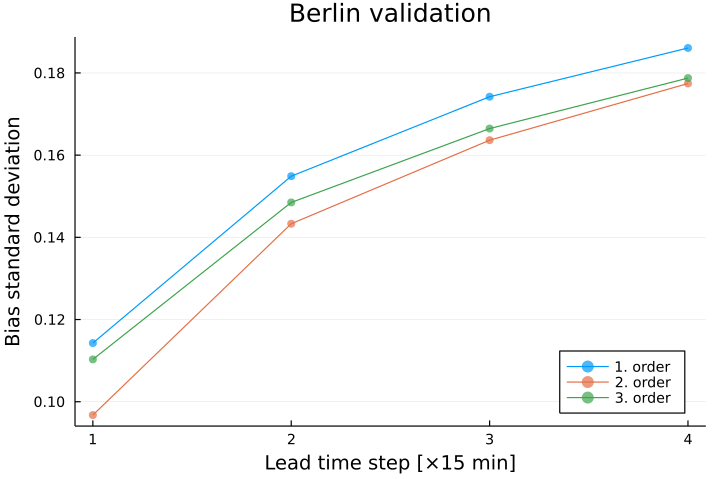

In [282]:
plot(1:4, [std1od std2od std3od], marker=(0.7, stroke(0)), grid=:y,
    lab=["1. order" "2. order" "3. order"], leg=:bottomright, 
    xlabel="Lead time step [×15 min]", ylabel="Bias standard deviation", title=city*" validation")

In [277]:
std1od = []
std2od = []
std3od = []
for st in 1:4
    df1 = getDF(1, st; n=N, data_train_cls=data_train_cls, binStarts=binStarts, binMean=binMean,
        df_test=df02, d_test=test2020, d_neib=test2020_neib_w)
    df2 = getDF(2, st; n=N, data_train_cls=data_train_cls, binStarts=binStarts, binMean=binMean,
        df_test=df02, d_test=test2020, d_neib=test2020_neib_w)
    df3 = getDF(3, st; n=N, data_train_cls=data_train_cls, binStarts=binStarts, binMean=binMean,
        df_test=df02, d_test=test2020, d_neib=test2020_neib_w)
    push!(std1od, std(df1.dif_pred))
    push!(std2od, std(df2.dif_pred))
    push!(std3od, std(df3.dif_pred))
end

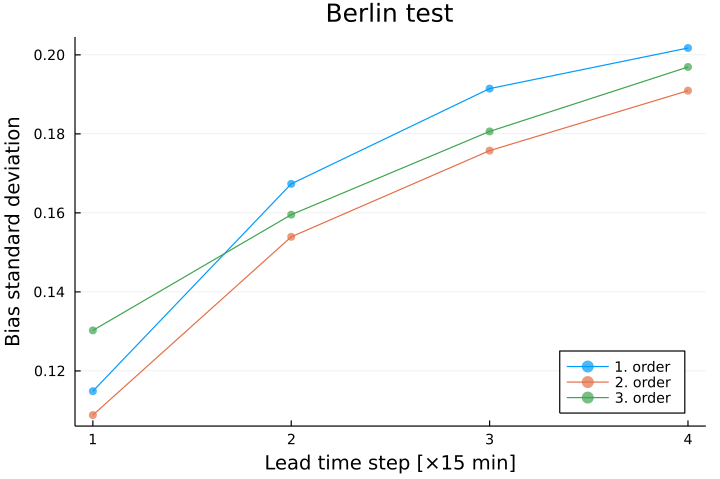

In [280]:
plot(1:4, [std1od std2od std3od], marker=(0.7, stroke(0)), grid=:y,
    lab=["1. order" "2. order" "3. order"], leg=:bottomright, 
    xlabel="Lead time step [×15 min]", ylabel="Bias standard deviation", title=city*" test")

In [261]:
df11 = getDF(1, 1)
df12 = getDF(1, 2)
df13 = getDF(1, 3)
df14 = getDF(1, 4)

In [267]:
df31 = getDF(3, 1)
df32 = getDF(3, 2)
df33 = getDF(3, 3)
df34 = getDF(3, 4)

### std dev

In [26]:
col1 = combine(df2t, :dif_pred_n => mean => :pred_n)
append!(col1, combine(df3t, :dif_pred_n => mean => :pred_n))
append!(col1, combine(df4t, :dif_pred_n => mean => :pred_n))

col2 = reshape([NaN; Array(col1)], 4);

mns = aplTs(df1t, mean)
append!(mns, aplTs(df2t, mean))
append!(mns, aplTs(df3t, mean))
append!(mns, aplTs(df4t, mean));

insertcols!(mns, 4, :pred_n => col2)

In [55]:
sds = aplTs(df1t, std)
append!(sds, aplTs(df2t, std))
append!(sds, aplTs(df3t, std))
append!(sds, aplTs(df4t, std));

col3 = combine(df2t, :dif_pred_n => std => :pred_n)
append!(col3, combine(df3t, :dif_pred_n => std => :pred_n))
append!(col3, combine(df4t, :dif_pred_n => std => :pred_n))

col4 = reshape([NaN; Array(col3)], 4);

insertcols!(sds, 4, :pred_n => col4)

,pers,neib,pred,pred_n,hyb_m,hyb_r
,Float64,Float64,Float64,Float64,Float64,Float64
1,0.113201,0.125717,0.108829,NaN,0.109146,0.108712
2,0.162768,0.166787,0.153942,0.16371,0.153504,0.148392
3,0.184951,0.184282,0.175759,0.189116,0.166448,0.16438
4,0.199795,0.197751,0.19093,0.204107,0.180372,0.179403


In [6]:
sds = aplTs(df1t, std)
append!(sds, aplTs(df2t, std))
append!(sds, aplTs(df3t, std))
append!(sds, aplTs(df4t, std));

col3 = combine(df2t, :dif_pred_n => std => :pred_n)
append!(col3, combine(df3t, :dif_pred_n => std => :pred_n))
append!(col3, combine(df4t, :dif_pred_n => std => :pred_n))

col4 = reshape([NaN; Array(col3)], 4);

insertcols!(sds, 4, :pred_n => col4)

,pers,neib,pred,pred_n,hyb_m,hyb_r
,Float64,Float64,Float64,Float64,Float64,Float64
1,0.113201,0.125717,0.108829,NaN,0.109146,0.108712
2,0.162768,0.166787,0.153942,0.16371,0.153504,0.148392
3,0.184951,0.184282,0.175759,0.189116,0.166448,0.16438
4,0.199795,0.197751,0.19093,0.204107,0.180372,0.179403


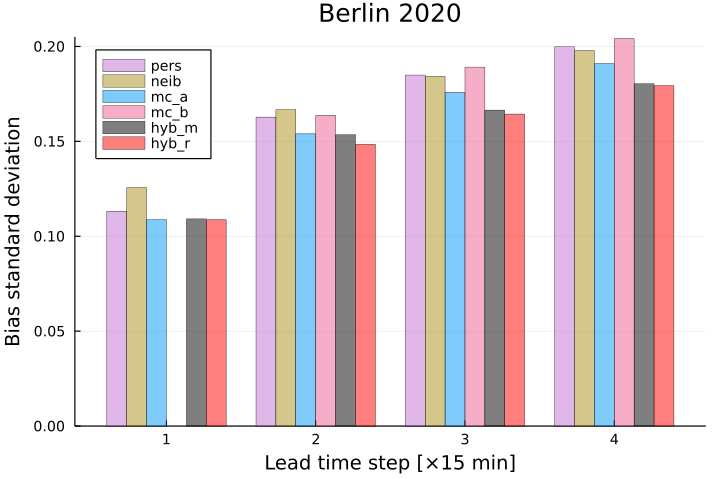

In [7]:
gb_be = groupedbar(Matrix(sds), leg=:topleft, label=["pers" "neib" "mc_a" "mc_b" "hyb_m" "hyb_r"],
    c=[4 5 1 7 "black" "red"], lw=0.3, fillalpha=0.5, grid=:y, 
    ylim=(0, 0.205), xlabel="Lead time step [×15 min]", ylabel="Bias standard deviation", title=city*" 2020")

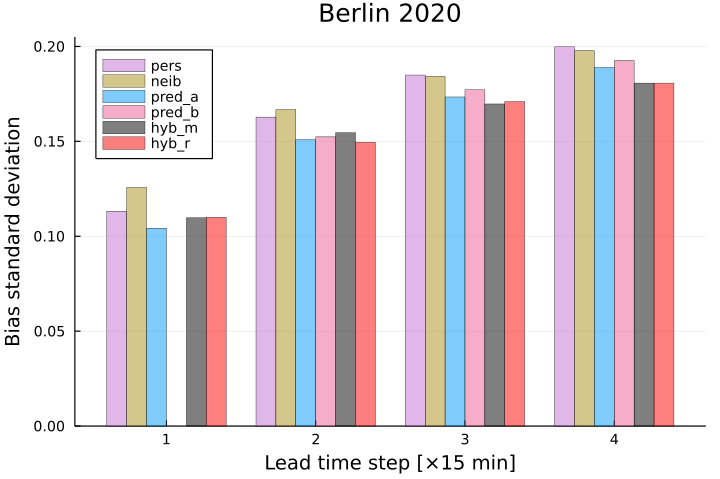

In [159]:
# newcolornew
gb_be = groupedbar(Matrix(sds), leg=:topleft, label=["pers" "neib" "mc_a" "mc_b" "hyb_m" "hyb_r"],
    c=[4 5 1 7 "black" "red"], lw=0.3, fillalpha=0.5, grid=:y, 
    ylim=(0, 0.205), xlabel="Lead time step [×15 min]", ylabel="Bias standard deviation", title=city*" 2020")

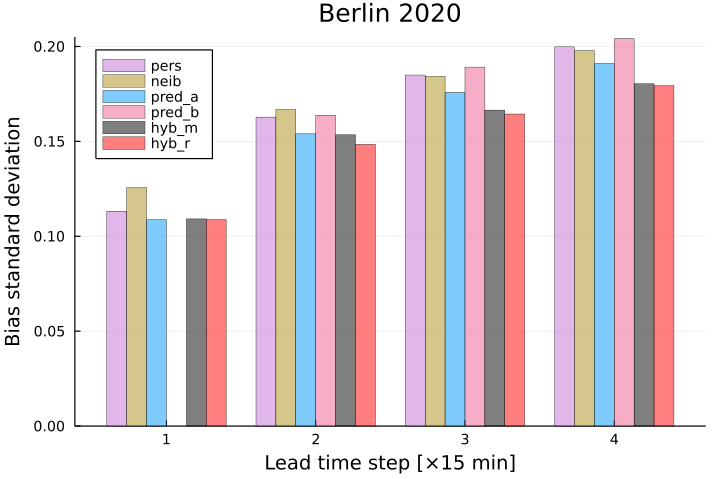

In [56]:
# newcolor
gb_be = groupedbar(Matrix(sds), leg=:topleft, label=["pers" "neib" "pred_a" "pred_b" "hyb_m" "hyb_r"],
    c=[4 5 1 7 "black" "red"], lw=0.3, fillalpha=0.5, grid=:y, 
    ylim=(0, 0.205), xlabel="Lead time step [×15 min]", ylabel="Bias standard deviation", title=city*" 2020")

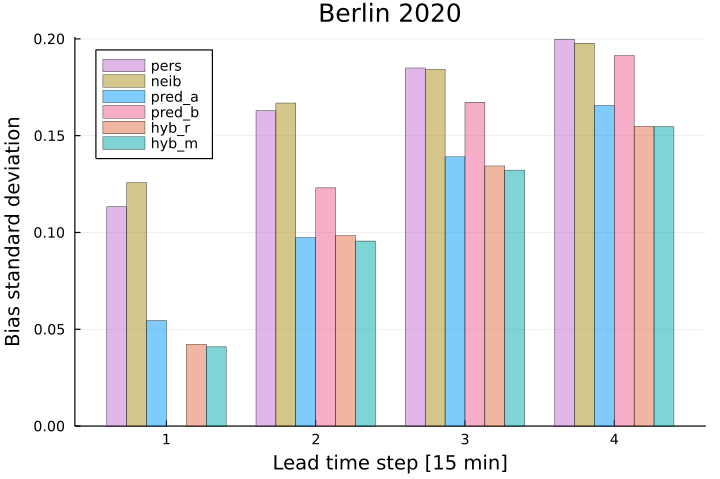

In [70]:
gb_be = groupedbar(Matrix(sds), leg=:topleft, label=["pers" "neib" "pred_a" "pred_b" "hyb_r" "hyb_m"],
    c=[4 5 1 7 2 6], lw=0.3, fillalpha=0.5, grid=:y, 
    ylim=(0, 0.201), xlabel="Lead time step [15 min]", ylabel="Bias standard deviation", title=city*" 2020")

In [37]:
gb1 = groupedbar(Matrix(mns), leg=:none, 
    c=[4 5 1 2 6], ylim=(0, 0.0205), ylabel="Bias mean")

gb2 = groupedbar(Matrix(sds), leg=:topleft, label=["pers" "neib" "pred" "hyb_r" "hyb_m"],
    c=[4 5 1 2 6],
    ylim=(0, 0.201), ylabel="Bias standard deviation");

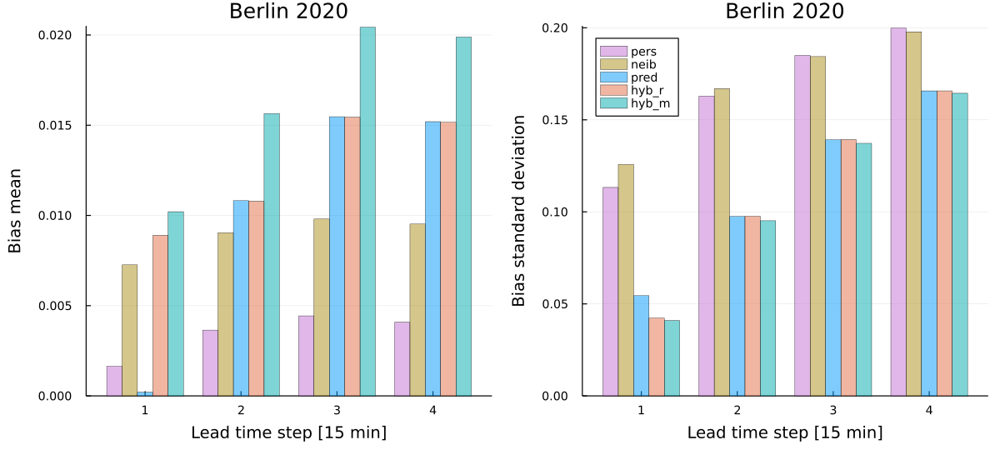

In [38]:
gbs = plot(gb1, gb2, layout=@layout([a b]), lw=0.3, fillalpha=0.5, grid=:y,
    xlabel="Lead time step [15 min]", title="Berlin 2020",
    leftmargin=20px, bottommargin=20px, size=(1000, 450))

### Monthly avg

In [23]:
gbb = groupby(df1t, :month)
ghi_mo = [mean(g.ghi) for g in gbb]
cmf_mo = [mean(g.real) for g in gbb];

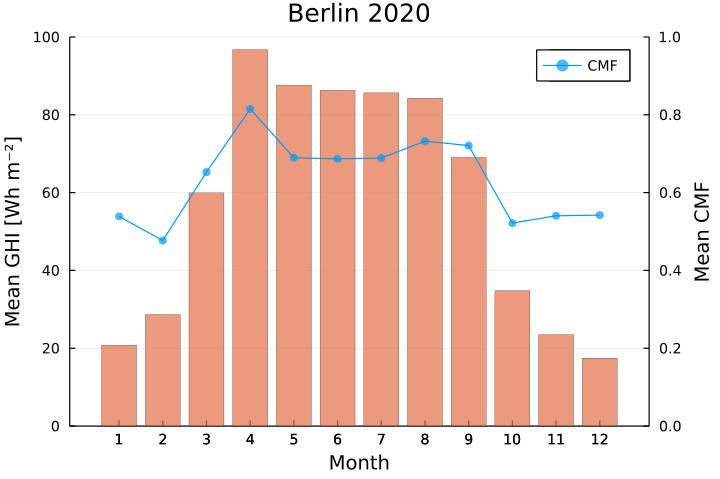

In [16]:
avg_be = bar(ghi_mo, c=2, lw=0.2, fillalpha=0.7, grid=:y, right_margin=1.3cm,
    xtick=1:12, ytick=0:20:100, ylim=(0,100), 
    xlabel="Month", ylabel="Mean GHI [Wh m⁻²]", title=city*" 2020")
plot!(twinx(), cmf_mo, marker=(0.7, stroke(0)), 
    xtick=1:12, ylim=(0,1), label="CMF", ylabel="Mean CMF") 

### distri

In [6]:
ticks = rd.(binMean, 2)
xti = (binMean[[1:2:24; 30]], ticks[[1:2:24; 30]]);

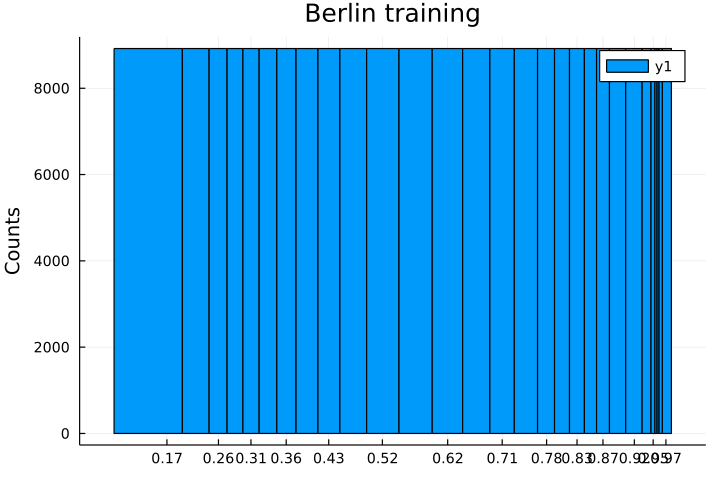

In [140]:
h_train = histogram(data_train, bins=binStarts, xticks=xti, ylabel="Counts",
    title=city*" training")

In [7]:
h_train = histogram(data_train, bins=binStarts, xticks=xti, ylabel="Counts",
    title="(a) training")

h_vali = histogram(df21.real, bins=binStarts, xticks=xti, 
    title="(b) validation")

h_test = histogram(df21_2020.real, bins=binStarts, xticks=xti, 
    title="(c) test");

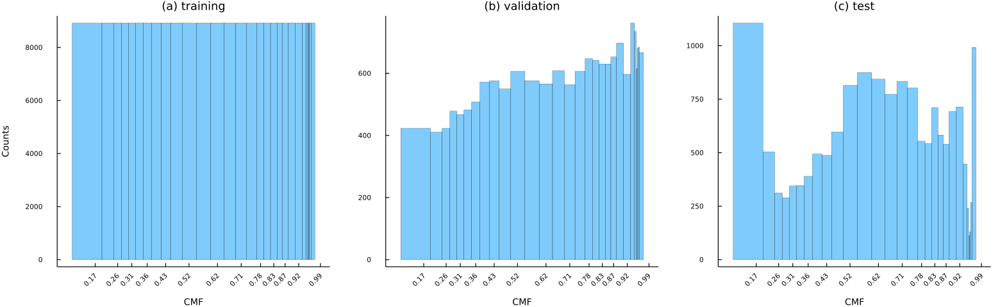

In [8]:
hists = plot(h_train, h_vali, h_test, layout=@layout([a b c]), leg=false, grid=false, xlabel="CMF", xrotation=45, 
    lw=0.2, fillalpha=0.5, labelfontsize=8, titlefontsize=10, tickfontsize=6, ylim=(0, ),
    leftmargin=20px, bottommargin=20px, size=(1300,400))

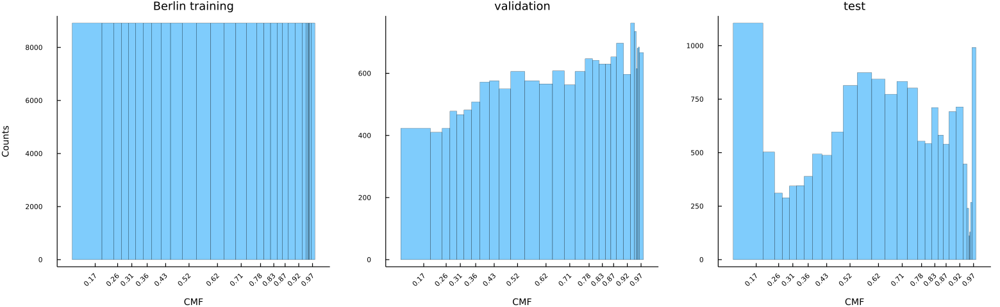

In [147]:
hists = plot(h_train, h_vali, h_test, layout=@layout([a b c]), leg=false, grid=false, xlabel="CMF", xrotation=45, 
    lw=0.2, fillalpha=0.5, labelfontsize=8, titlefontsize=10, tickfontsize=6, ylim=(0, ),
    leftmargin=20px, bottommargin=20px, size=(1300,400))

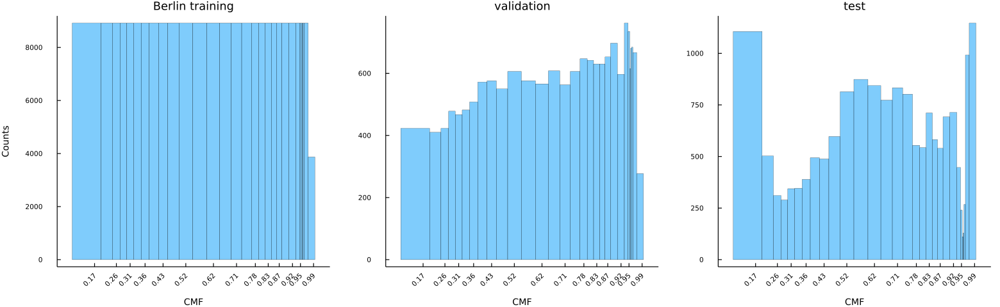

In [18]:
hists = plot(h_train, h_vali, h_test, layout=@layout([a b c]), leg=false, grid=false, xlabel="CMF", xrotation=45, 
    lw=0.2, fillalpha=0.5, labelfontsize=8, titlefontsize=10, tickfontsize=6, ylim=(0, ),
    leftmargin=20px, bottommargin=20px, size=(1300,400))

### heatmaps

#### train

In [42]:
# rewrite transition matrix
state = data_train_cls
len = length(state)
T2 = zeros(N, N, N) # 2. od
for i in 2:len-1
    T2[state[i-1], state[i], state[i+1]] += 1
end
sumZ = sum(T2; dims=3)
T22 = T2./sumZ
T_train = sum([T22[:, :, i] * binMean[i] for i in 1:30]);

30×30 Matrix{Float64}:
   0.213818    0.281747    0.314274  0.338495  0.37369   0.420056  0.463879  0.494226  0.520531  …  NaN         NaN         NaN           0.430793  NaN         NaN         NaN         0.915987
   0.219746    0.246403    0.296921  0.328775  0.376172  0.40379   0.444227  0.482014  0.544883       0.888606    0.666498  NaN           0.396424    0.396424  NaN           0.947112  0.966057
   0.245249    0.250008    0.276249  0.328667  0.35264   0.384202  0.43275   0.490463  0.492647       0.642515    0.587929    0.606445    0.67339   NaN           0.447733  NaN         0.942857
   0.237517    0.260379    0.271684  0.299544  0.352263  0.375359  0.420396  0.470483  0.496743       0.693367    0.786182    0.780998  NaN           0.950541    0.509034    0.876105  0.97409
   0.254423    0.278164    0.282097  0.299934  0.324791  0.383228  0.412923  0.447832  0.488569       0.881134    0.683682    0.800293    0.790752    0.430793  NaN           0.93093   0.925542
   0.255008  

#### test

In [25]:
s_t_2 = df21.pers_cls
s_t_1 = df21.real_cls
pred = df21.pred;

T, T_ct = zeros(N, N), zeros(N, N)
len = length(pred)
for i in 1:len-1
    T[s_t_2[i], s_t_1[i]] += pred[i+1]
    T_ct[s_t_2[i], s_t_1[i]] += 1
end

T_test = T ./ T_ct;

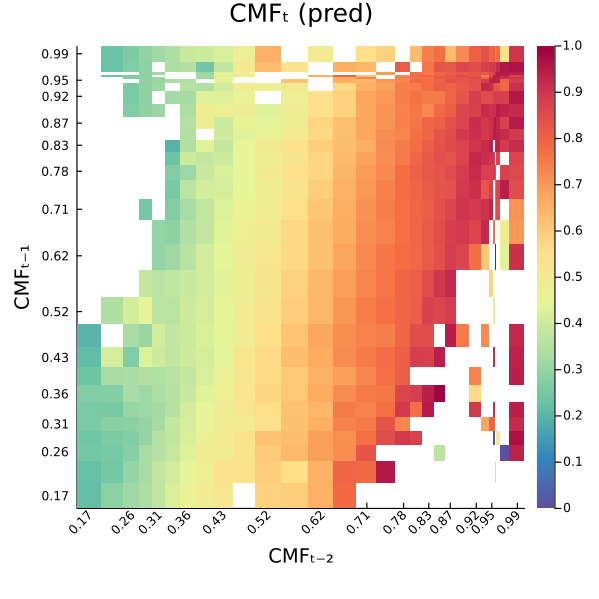

In [38]:
hm_test = heatmap(binMean, binMean, T_test, c=cgrad(:Spectral_10, rev=true), clim=(0,1), grid=false, 
    title="CMFₜ (pred)", size=(500,500), tickfontsize=7,
    xticks=xti, yticks=xti, xrotation=45, 
    xlabel="CMFₜ₋₂", ylabel="CMFₜ₋₁")

### dif CMF vs Err

In [7]:
dif1 = viz_dif(df1t, 1, tit=tit_steps[1])

dif2 = viz_dif(df2t, 2, tit=tit_steps[2])
dif3 = viz_dif(df3t, 3, tit=tit_steps[3])
dif4 = viz_dif(df4t, 4, tit=tit_steps[4]);

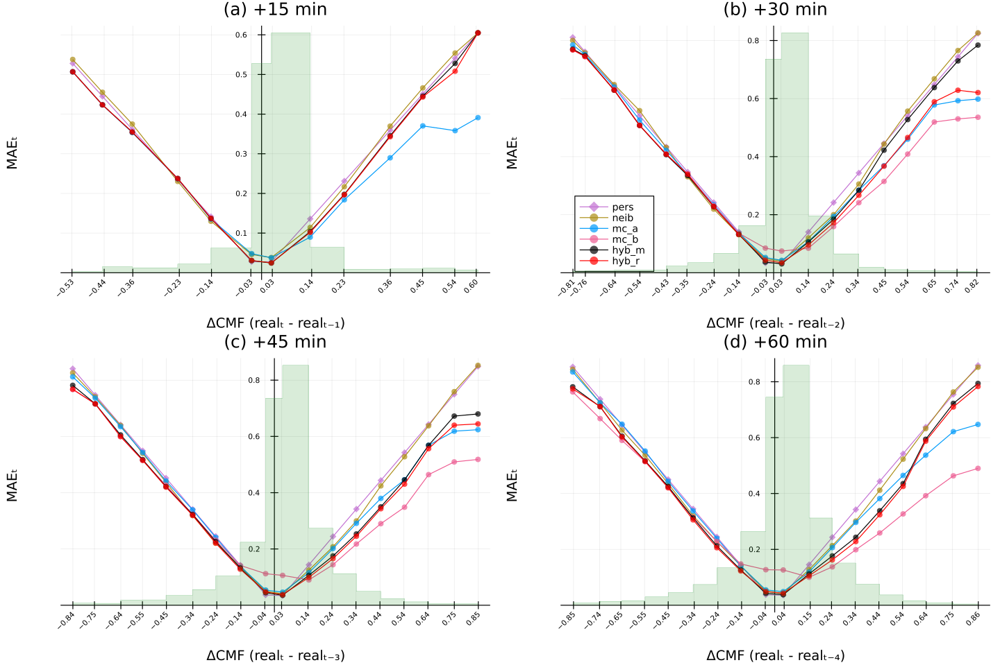

In [8]:
difs = plot(dif1, dif2, dif3, dif4, layout=@layout([a b; c d]), size=(1200, 800), #ylim=(0, 1.01), 
    leftmargin=20px, ylabel="MAEₜ")

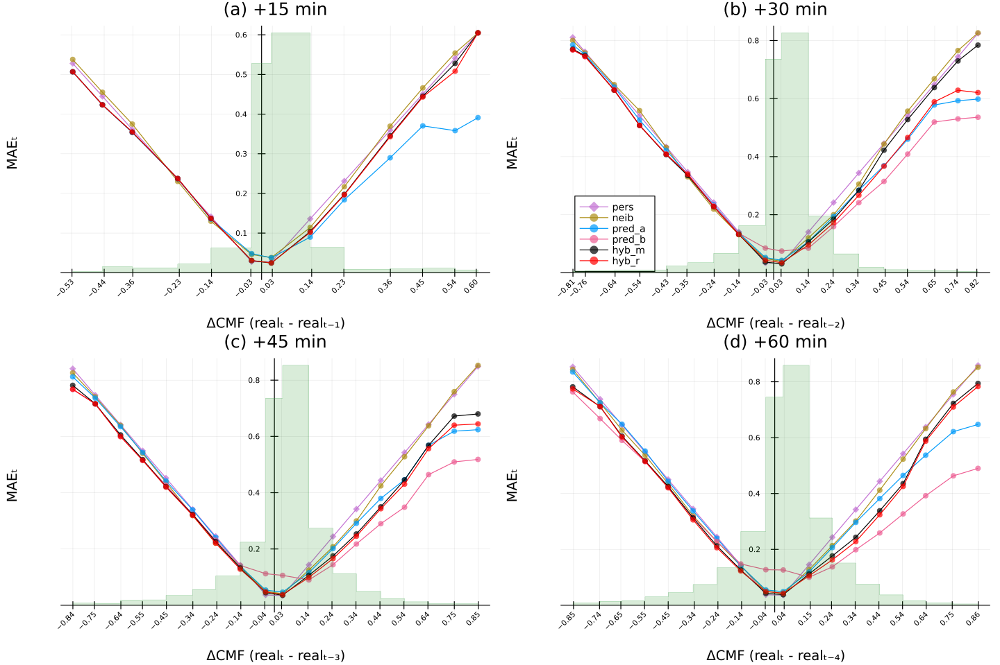

In [15]:
# newcolornew
difs = plot(dif1, dif2, dif3, dif4, layout=@layout([a b; c d]), size=(1200, 800), #ylim=(0, 1.01), 
    leftmargin=20px, ylabel="MAEₜ")

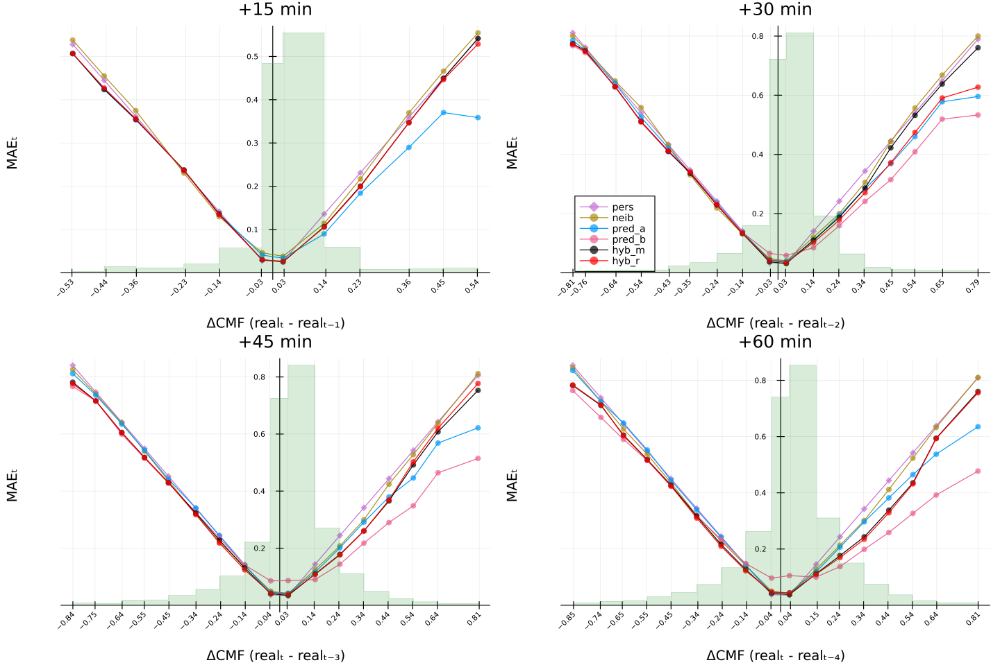

In [161]:
# newcolornew
difs = plot(dif1, dif2, dif3, dif4, layout=@layout([a b; c d]), size=(1200, 800), #ylim=(0, 1.01), 
    leftmargin=20px, ylabel="MAEₜ")

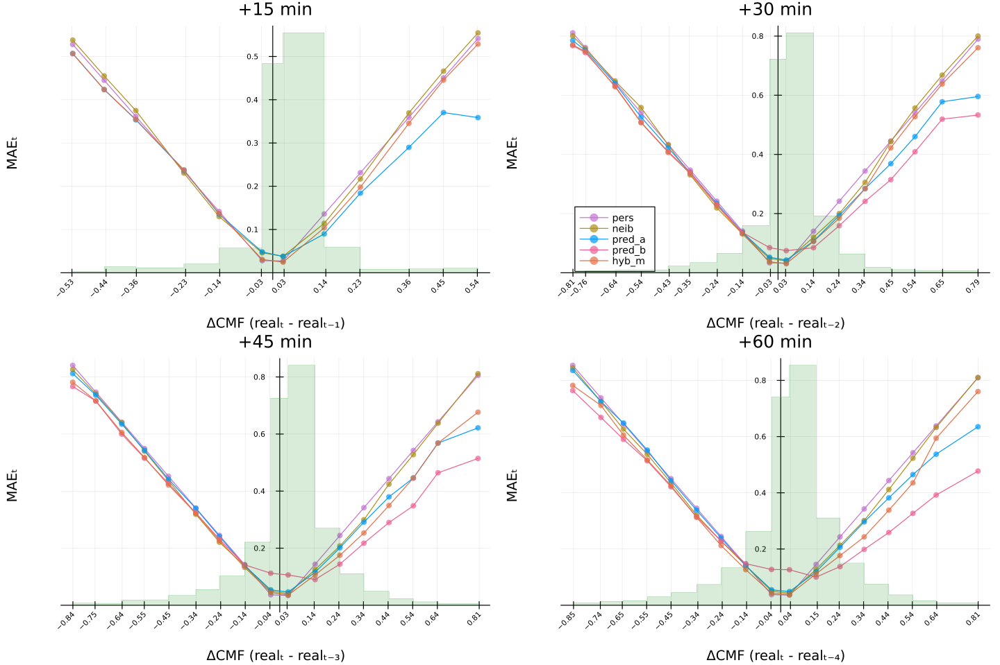

In [159]:
difs = plot(diff1, diff2, diff3, diff4, layout=@layout([a b; c d]), size=(1200, 800), #ylim=(0, 1.01), 
    leftmargin=20px, ylabel="MAEₜ")

### mn ± sd histo

In [41]:
h21 = hist_dif_pred_pers(df21, 2, 1)
h22 = hist_dif_pred_pers(df22, 2, 2)

In [43]:
h21_cls = hist_cls_dif_pred_pers(df21, 2, 1)
h22_cls = hist_cls_dif_pred_pers(df22, 2, 2)

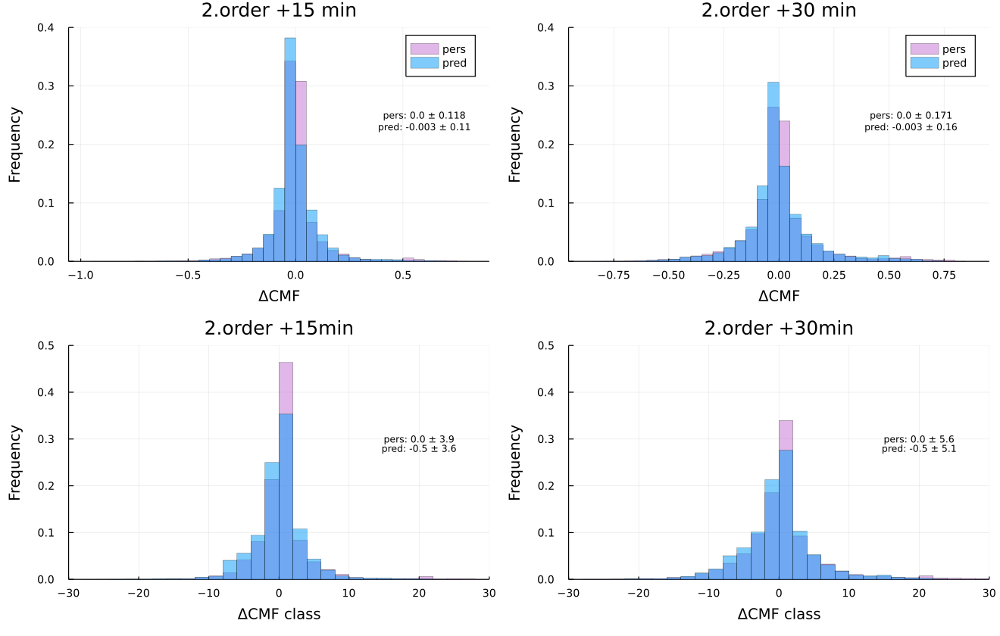

In [49]:
hists = plot(h21, h22, h21_cls, h22_cls, layout=@layout([a b; c d]), 
    leftmargin=20px, bottommargin=20px, dpi=120, fmt=:png, size=(1100,700))

In [61]:
h23_cls = hist_cls_dif_pred_pers(df23, 2, 3)
h24_cls = hist_cls_dif_pred_pers(df24, 2, 4);

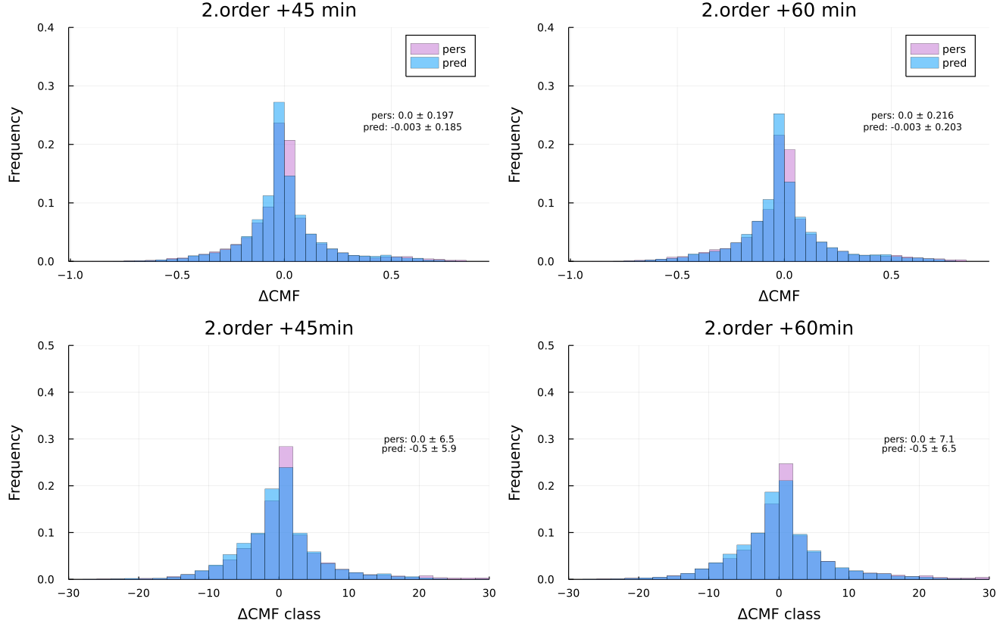

In [62]:
hists34 = plot(h23, h24, h23_cls, h24_cls, layout=@layout([a b; c d]), 
    leftmargin=20px, bottommargin=20px, dpi=120, fmt=:png, size=(1100,700))

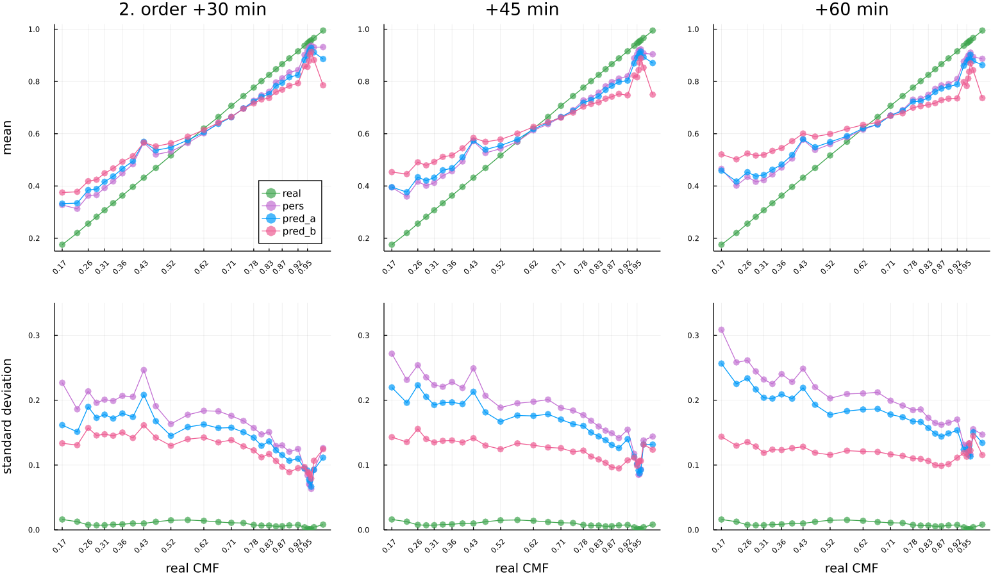

In [30]:
p = plot(mn2, mn3, mn4, sd2, sd3, sd4, layout=@layout([a b c; d e f]), marker=(0.7, :o, stroke(0)), 
    label=["real" "pers" "pred_a" "pred_b"],
    xticks=xti, xrotation=45, tickfontsize=6, labelfontsize=10,
    leftmargin=15px, bottommargin=15px, dpi=130, fmt=:png, size=(1200,700))

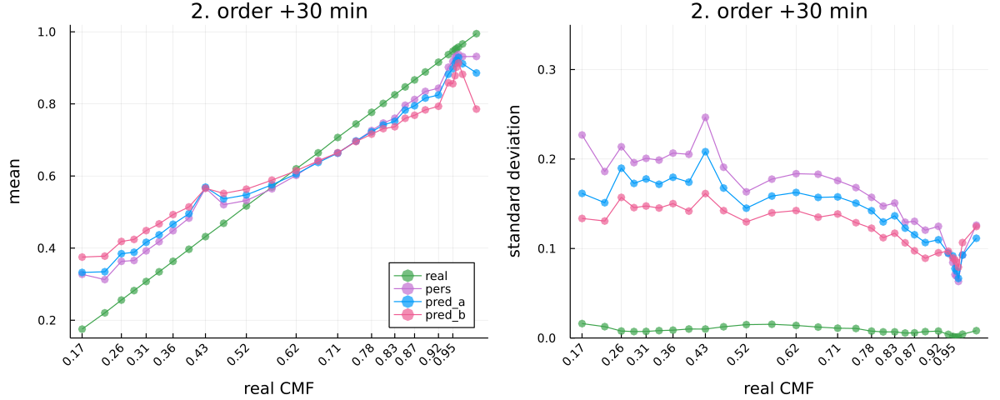

In [44]:
p = plot(mn2, sd2, marker=(0.7, :o, stroke(0)), 
    label=["real" "pers" "pred_a" "pred_b"],
    xticks=(binMean[1:2:26], ticks[1:2:26]), xrotation=45, 
    xlabel="real CMF", title="2. order +30 min",
    leftmargin=20px, bottommargin=20px, size=(1000,400))

### errors

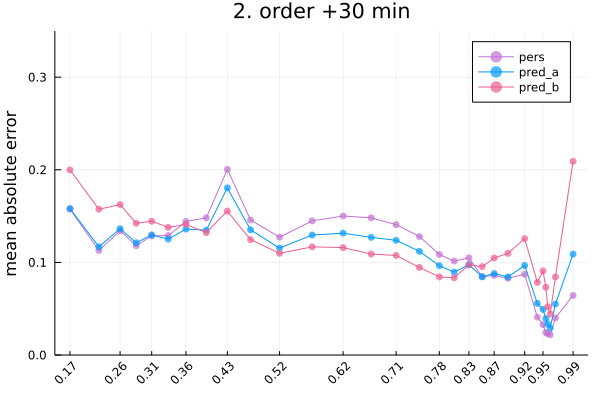

In [56]:
mae2 = viz_err(df22, binMean, xti; tit="2. order +$(15*2) min", err="mae")

In [53]:
mae3 = viz_err(df23, binMean, xti; tit="+$(15*3) min", err="mae")
mae4 = viz_err(df24, binMean, xti; tit="+$(15*4) min", err="mae")

rmse2 = viz_err(df22, binMean, xti; err="rmse")
rmse3 = viz_err(df23, binMean, xti; err="rmse")
rmse4 = viz_err(df24, binMean, xti; err="rmse");

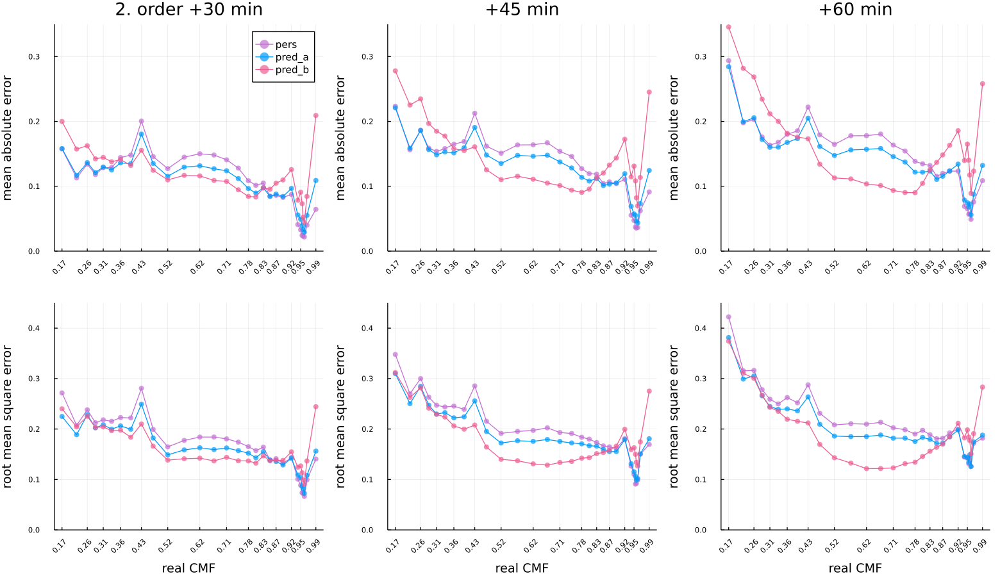

In [57]:
errs = plot(mae2, mae3, mae4, rmse2, rmse3, rmse4, layout=@layout([a b c; d e f]), 
    tickfontsize=6, labelfontsize=10,
    leftmargin=15px, bottommargin=15px, dpi=130, fmt=:png, size=(1200,700))

#### errors legacy

In [102]:
mae = viz_err(df21_, binMean, xti; tit="", err="mae")
rmse = viz_err(df21_, binMean, xti; tit="2. order +$(15*1) min", err="rmse")

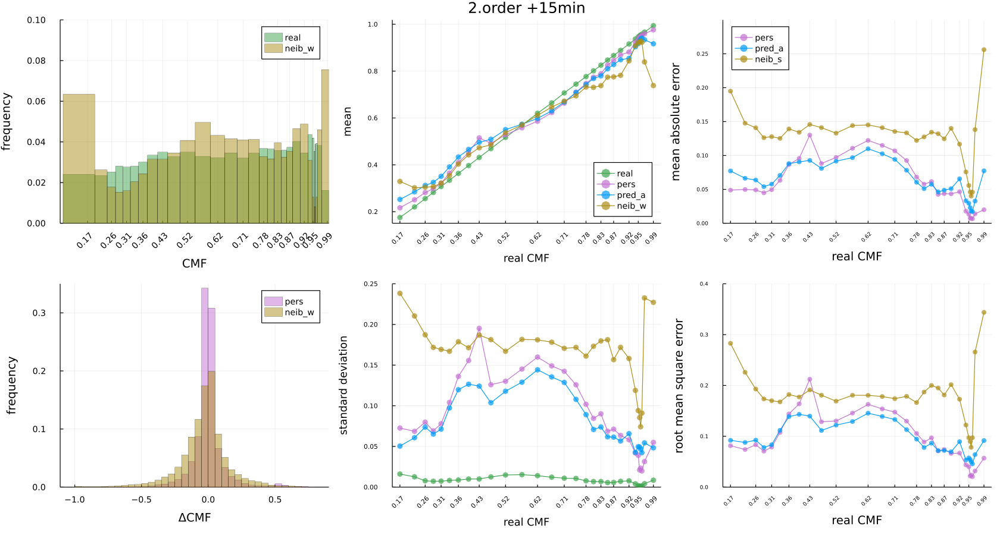

In [103]:
p = plot(h1, mns, mae, h2, sds, rmse, layout=@layout([a b c; d e f]), size=(1400, 750), fmt=:png,
        left_margin=20px, bottom_margin=20px)

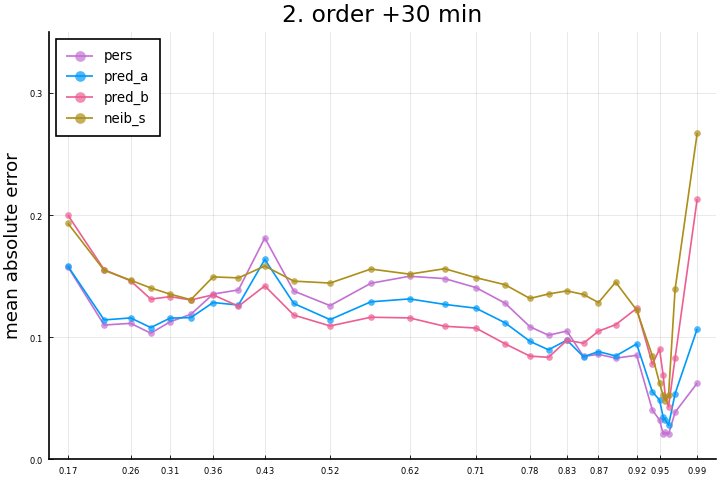

In [160]:
mae = viz_err(df22_, binMean, xti; tit="2. order +$(15*2) min", err="mae")

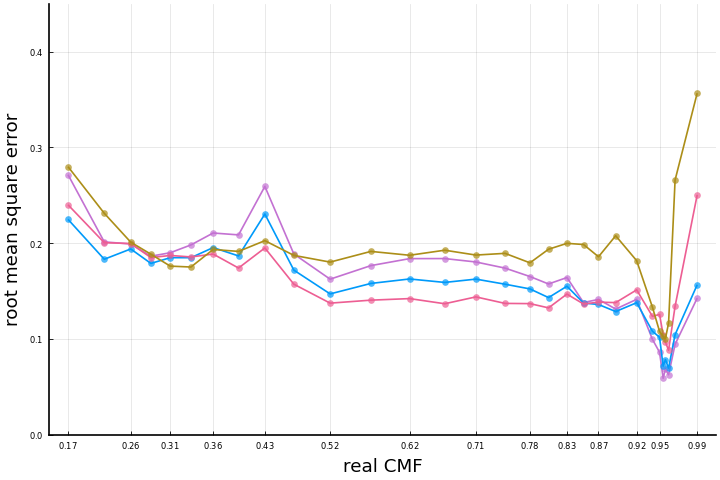

In [161]:
rmse = viz_err(df22_, binMean, xti; tit="2. order +$(15*2) min", err="rmse")

### boxplot

In [51]:
b21 = viz_box(df21, 1, "Berlin 2.order t+$(15*1) min")

b22 = viz_box(df22, 2, "t+$(15*2) min")
b23 = viz_box(df23, 3, "t+$(15*3) min")
b24 = viz_box(df24, 4, "t+$(15*4) min");

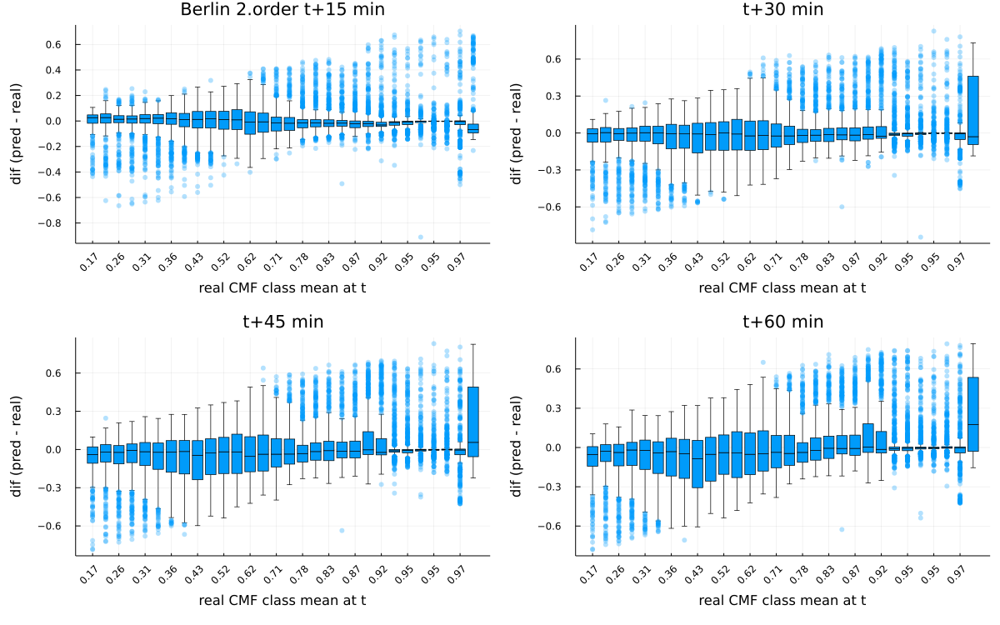

In [54]:
boxes2 = plot(b21, b22, b23, b24, layout=@layout([a b; c d]), size=(1200, 750), 
    left_margin=25px, bottom_margin=25px, fmt=:png)

### mn ± sd 

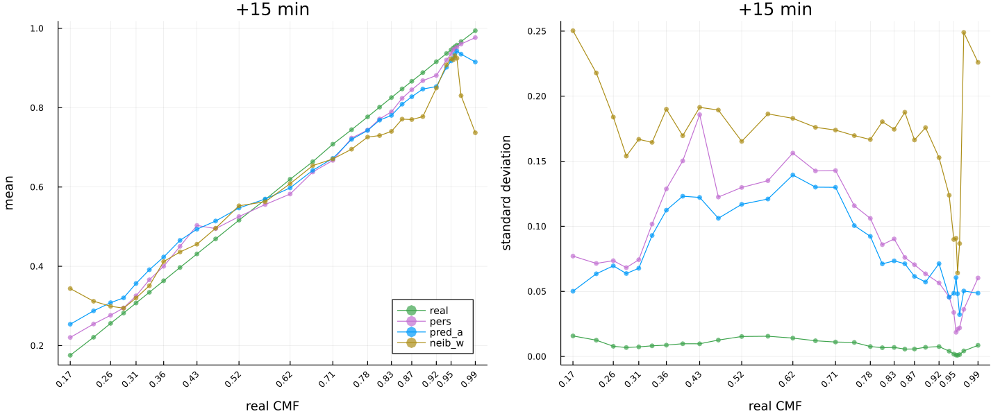

In [38]:
p_mn1 = viz_mn_sd(df21; tit="+$(15*1) min")

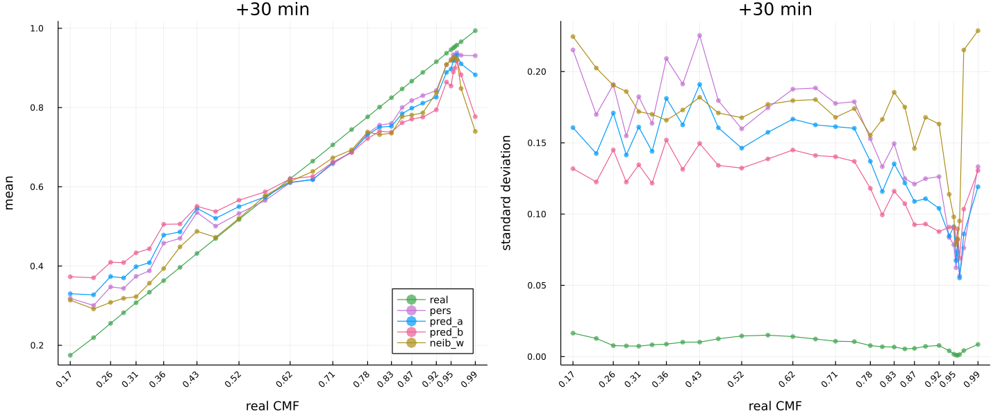

In [37]:
p_mn2 = viz_mn_sd(df22; tit="+30 min")

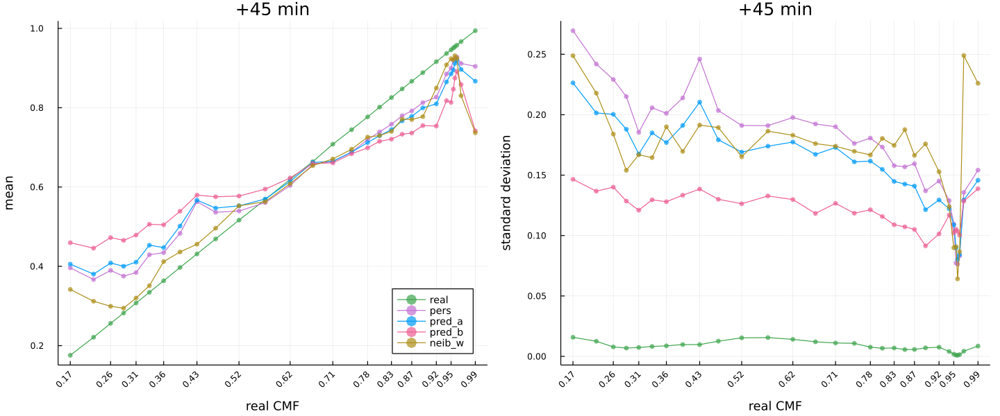

In [39]:
p_mn3 = viz_mn_sd(df23; tit="+$(15*3) min")

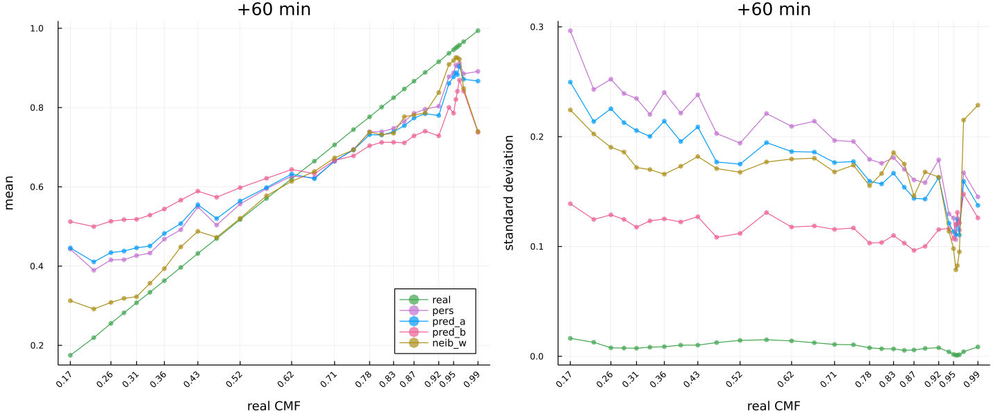

In [40]:
p_mn4 = viz_mn_sd(df24; tit="+$(15*4) min")

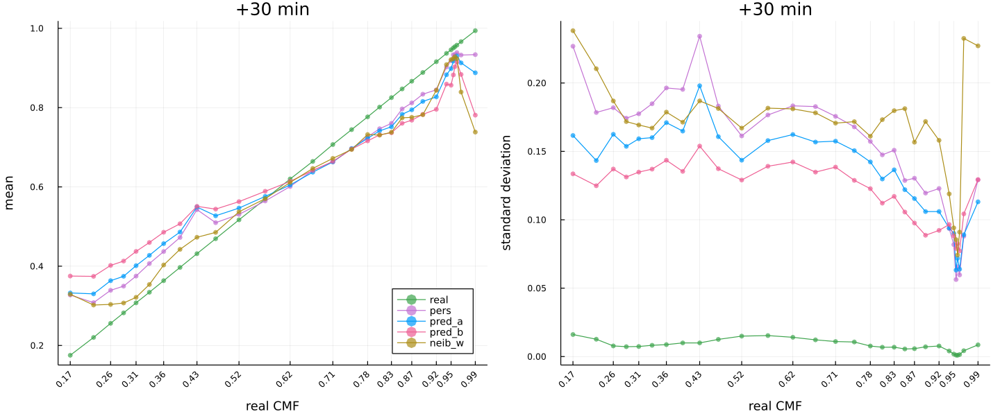

In [69]:
p = plot(mns, sds, xlabel="real CMF", xticks=xti, xrotation=45, 
    tickfontsize=7, labelfontsize=10, leftmargin=20px, bottommargin=20px, size=(1200, 500))

### Bias range

In [82]:
dff = df22[:, [:dif_pers, :dif_pred, :dif_pred_n, :dif_neib, :dif_hyb_m, :dif_hyb_r]]

,dif_pers,dif_pred,dif_pred_n,dif_neib,dif_hyb_m,dif_hyb_r
,Float64,Float64,Float64,Float64,Float64,Float64
1,0.126488,0.120898,0.1333,0.435005,0.1333,0.1333
2,-0.0971964,-0.026327,0.0416014,-0.0513477,-0.026327,-0.026327
3,0.0573434,0.0989448,0.145973,-0.0469821,0.0989448,0.0989448
4,0.00272383,0.0396683,0.101669,-0.0628862,0.0396683,0.0396683
5,-0.00451154,0.0292287,0.0971571,-0.0759591,0.0292287,0.0292287
6,-0.088423,-0.0591943,0.00873407,-0.0902705,-0.0591943,-0.0591943
7,-0.0903167,-0.0637855,-0.0110659,-0.0689947,-0.0903167,-0.0689947
8,-0.0281014,0.0214925,0.0455867,0.0623953,0.0214925,0.0455867
9,-0.170942,-0.146626,-0.0886402,-0.0852479,-0.0886402,-0.0852479


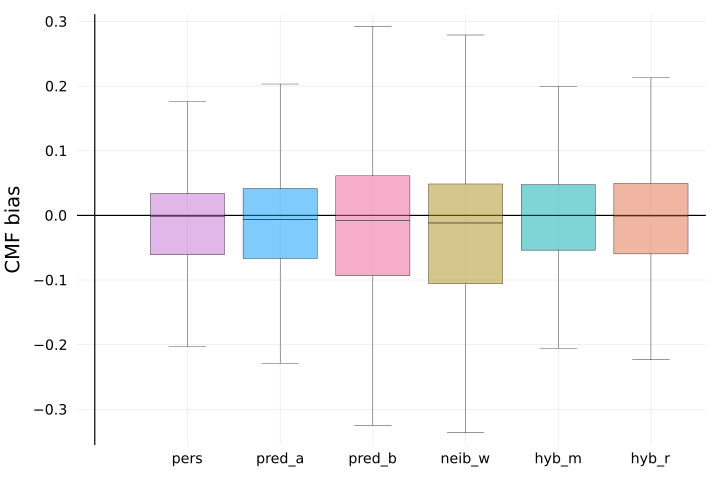

In [87]:
lab = ["pers", "pred_a", "pred_b", "neib_w", "hyb_m", "hyb_r"]
b = boxplot(Array(dff), leg=:none, frame=:zerolines, outliers=false, 
        c=[4 1 7 5 6 2], label=lab, xticks=(1:size(dff, 2), lab),
        fillalpha=0.5, lw=0.3, 
        ylabel="CMF bias") #, title=city)

### MAE vs RMSE

In [70]:
p2 = plot([maes_pers maes_pred maes_hyb maes_hyb_r], [rmses_pers rmses_pred rmses_hyb rmses_hyb_r], marker=(0.7, stroke(0)), 
    c=[4 1 2 9], label=["pers" "pred_a" "hybr_m" "hybr_r"], leg=:topleft,
    xlim=(0,0.22), ylim=(0,0.22),
    xlabel="MAE", ylabel="RMSE", title="Berlin 2.order")
plot!([maes_pred_n], [rmses_pred_n], c=[7 2 9], label="pred_b", marker=(0.7, stroke(0)), size=(670, 650), dpi=:120, fmt=:png)

annotate!(0.06, 0.095, text("+15 min", 8))
annotate!(0.11, 0.145, text("+$(15*2) min", 8))
# annotate!(0.1, 0.2, text("+$(15*3) min", 8))
annotate!(0.155, 0.21, text("+$(15*4) min", 8));

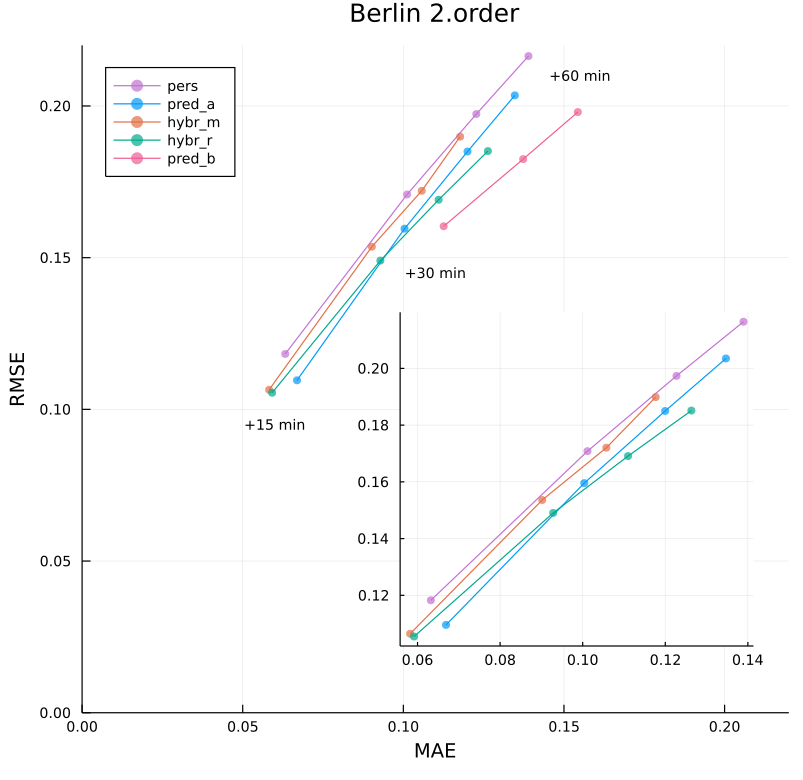

In [71]:
bb = bbox(0.45, 0.4, 0.5, 0.5)
plot!([maes_pers maes_pred maes_hyb maes_hyb_r], [rmses_pers rmses_pred rmses_hyb rmses_hyb_r], marker=(0.7, stroke(0)), 
    c=[4 1 2 9], leg=:none, inset=(1, bb), subplot=2)
# plot!(maes_pred_n, rmses_pred_n, c=7, marker=(0.7, stroke(0)), inset=(1, bb)) #, subplot=2)

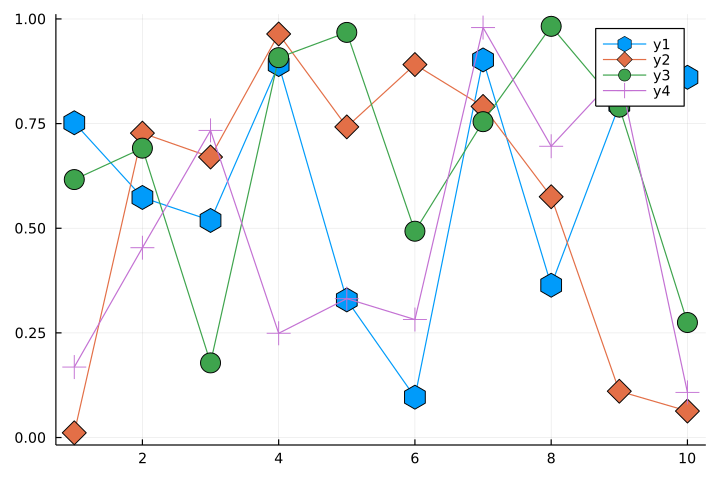

In [71]:
te = rand(10,4)
plot(te, marker=([:hex :d :circ :+], 10))

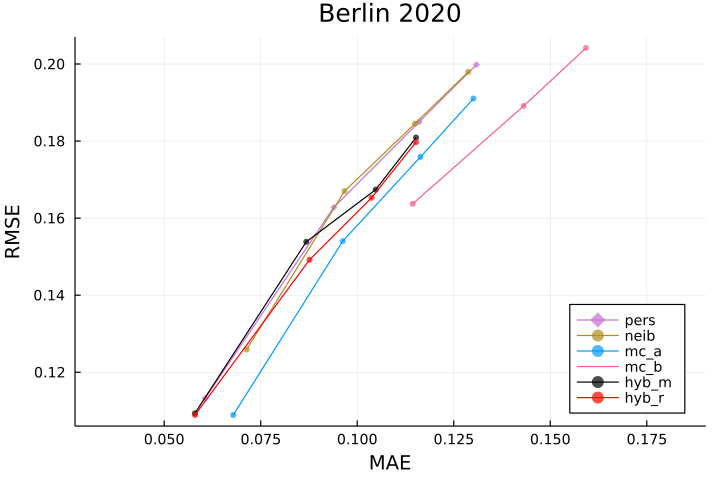

In [6]:
errs = mae_vs_rmse(df1t, df2t, df3t, df4t; tit=city*" 2020")

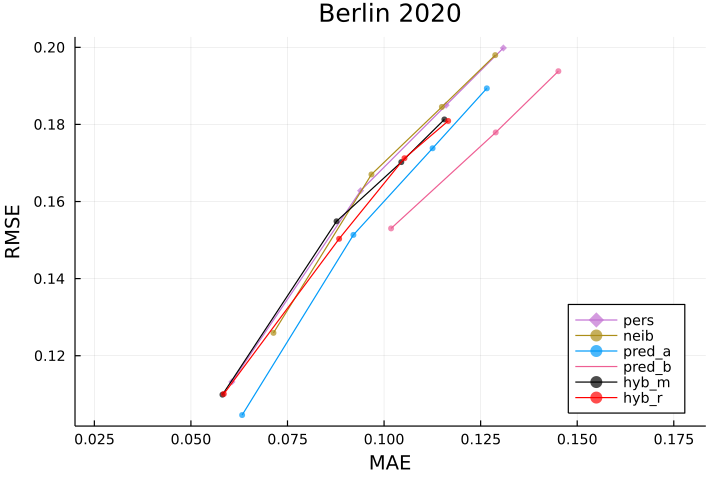

In [160]:
# newcolornew
errs = mae_vs_rmse(df1t, df2t, df3t, df4t; tit=city*" 2020")

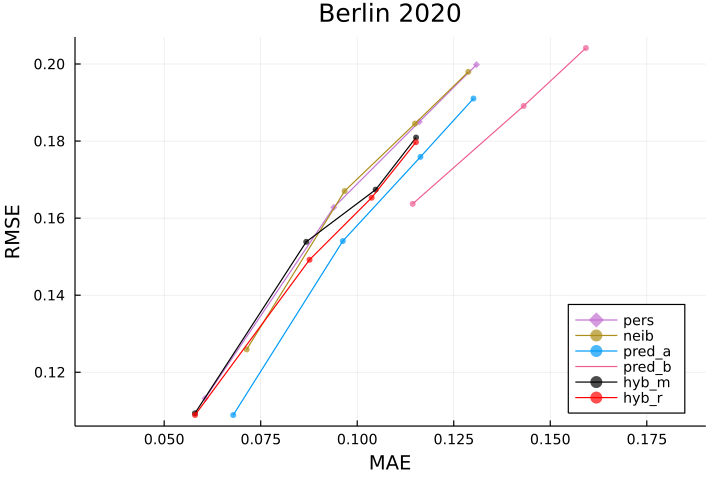

In [77]:
# newcolor
errs = mae_vs_rmse(df1t, df2t, df3t, df4t; tit=city*" 2020")

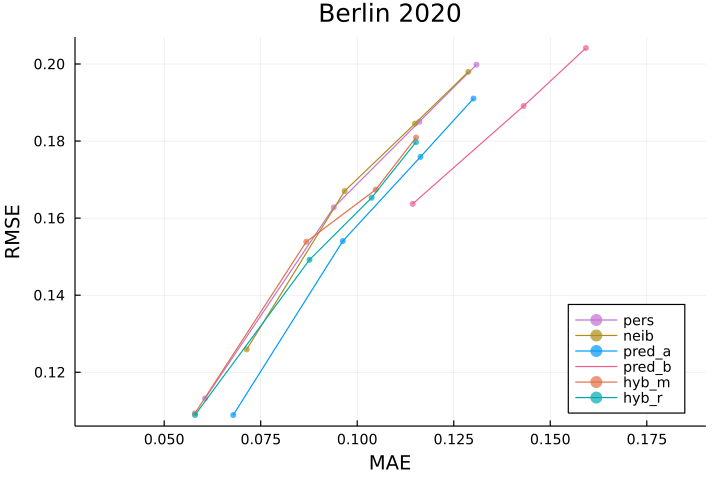

In [82]:
errs = mae_vs_rmse(df1t, df2t, df3t, df4t; tit=city*" 2020")

### Err by CMF class

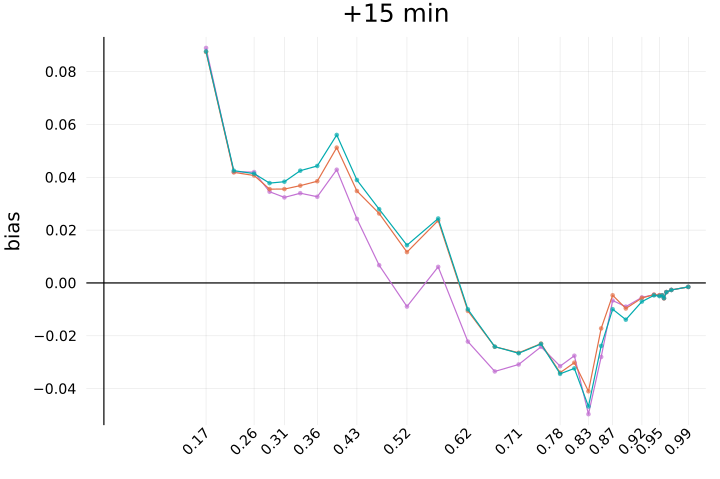

In [179]:
bi1 = viz_bias_by_cls(df1t, 1)

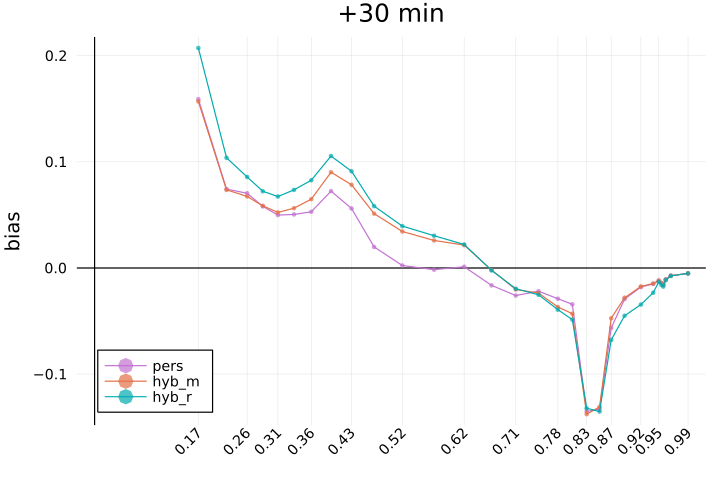

In [180]:
bi2 = viz_bias_by_cls(df2t, 2)

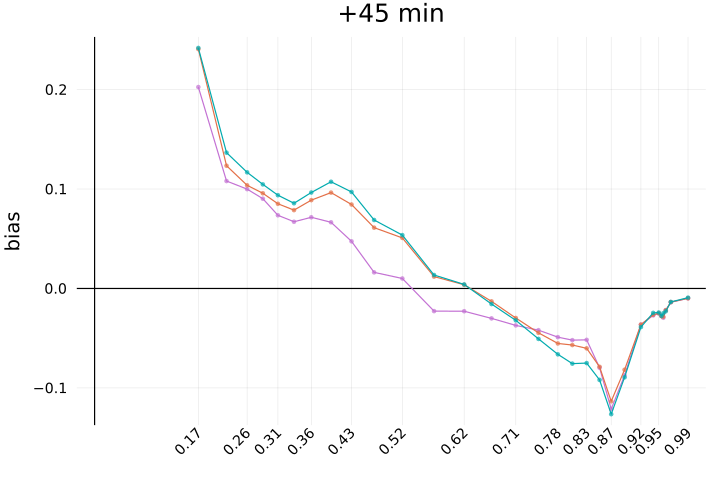

In [181]:
bi3 = viz_bias_by_cls(df3t, 3)

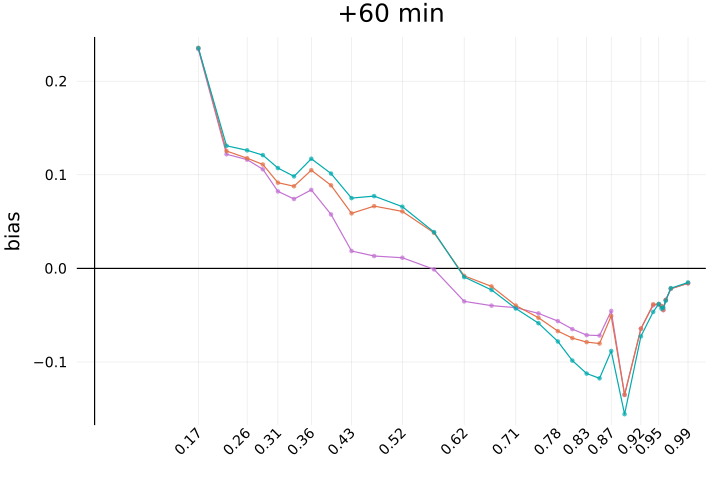

In [182]:
bi4 = viz_bias_by_cls(df4t, 4)

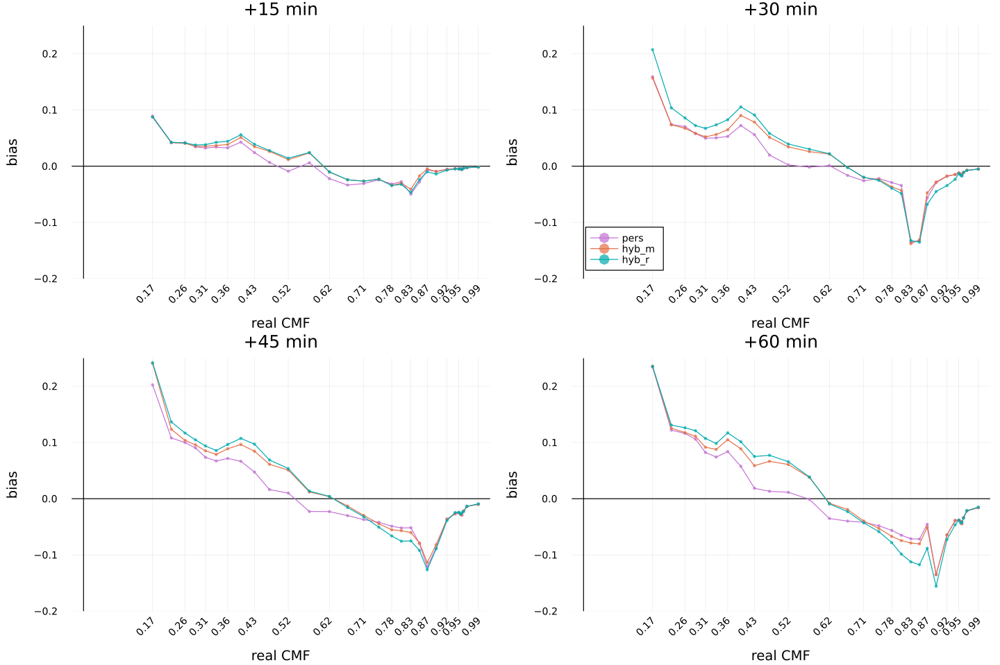

In [183]:
bias = plot(bi1, bi2, bi3, bi4, layout=@layout([a b; c d]), size=(1200, 800), 
    frame=:zerolines, leftmargin=20px, ylim=(-0.2, 0.25), 
    xlabel="real CMF", ylabel="bias", xticks=xti, xrotation=45)

#### bias legacy

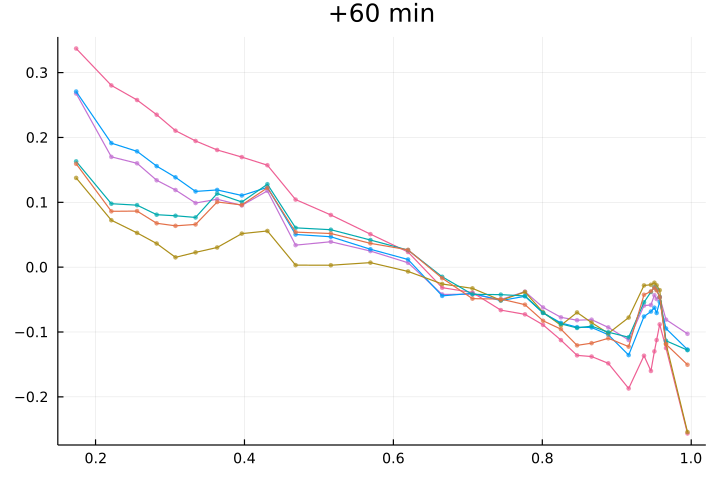

In [96]:
bi1 = viz_bias(df21; tit="+$(15*1) min")
bi2 = viz_bias(df22; tit="+$(15*2) min")
bi3 = viz_bias(df23; tit="+$(15*3) min")
bi4 = viz_bias(df24; tit="+$(15*4) min")

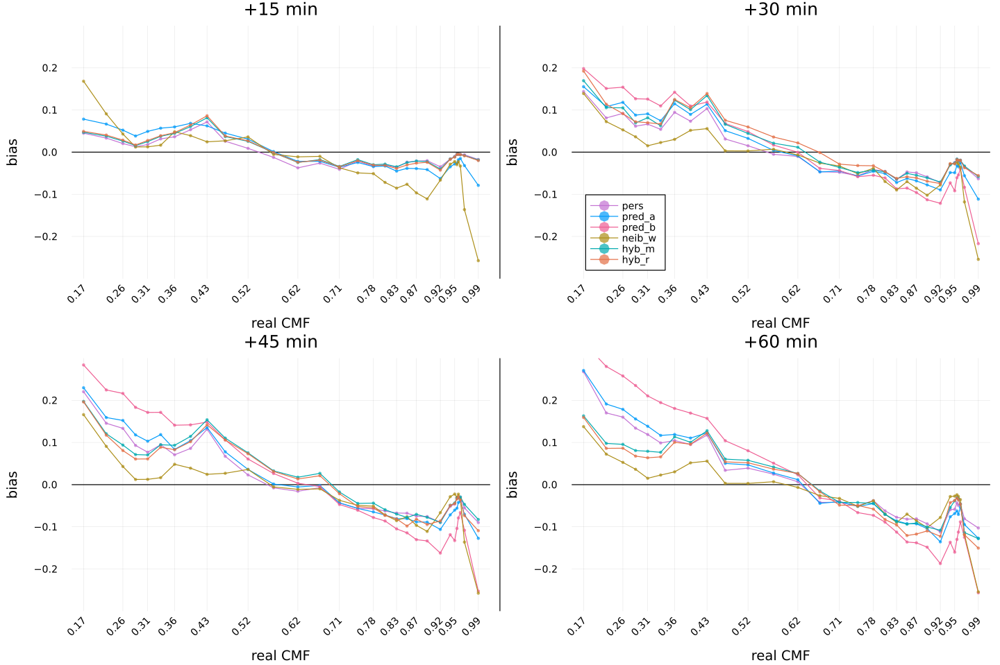

In [97]:
bias = plot(bi1, bi2, bi3, bi4, layout=@layout([a b; c d]), size=(1200, 800), 
    frame=:zerolines, leftmargin=20px, ylim=(-0.3, 0.3), 
    xlabel="real CMF", ylabel="bias", xticks=xti, xrotation=45)

In [9]:
# new
mae1 = viz_err1(df1t, binMean, xti; tit="(a) +$(15*1) min")
mae2 = viz_err1(df2t, binMean, xti; tit="(b) +$(15*2) min")
mae3 = viz_err1(df3t, binMean, xti; tit="(c) +$(15*3) min")
mae4 = viz_err1(df4t, binMean, xti; tit="(d) +$(15*4) min");

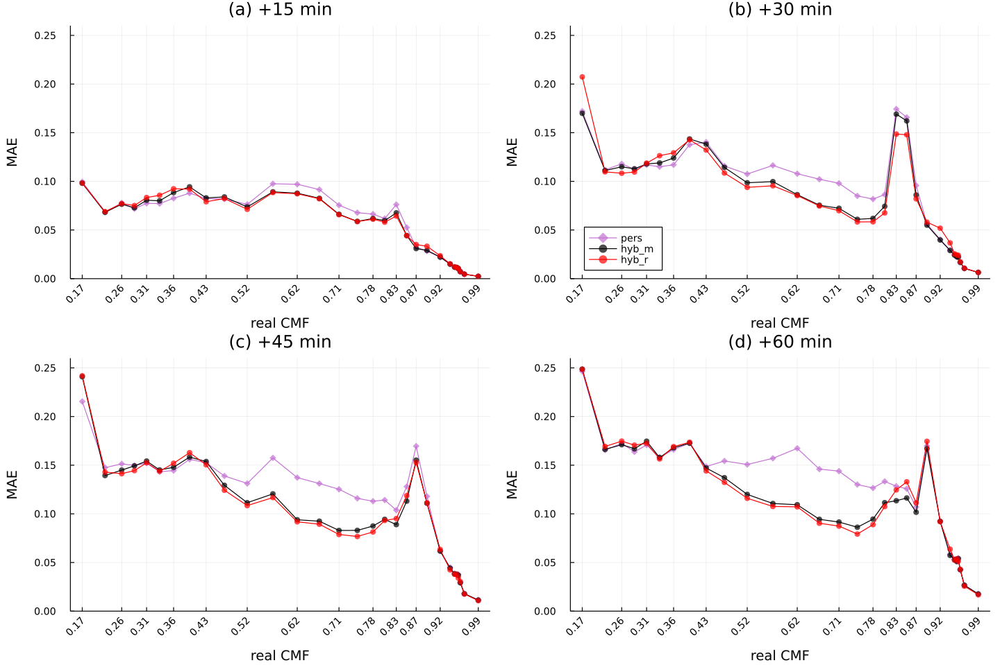

In [10]:
# newcolornew
maes = plot(mae1, mae2, mae3, mae4, layout=@layout([a b; c d]), size=(1200, 800), 
    leftmargin=20px, ylim=(0, 0.26))

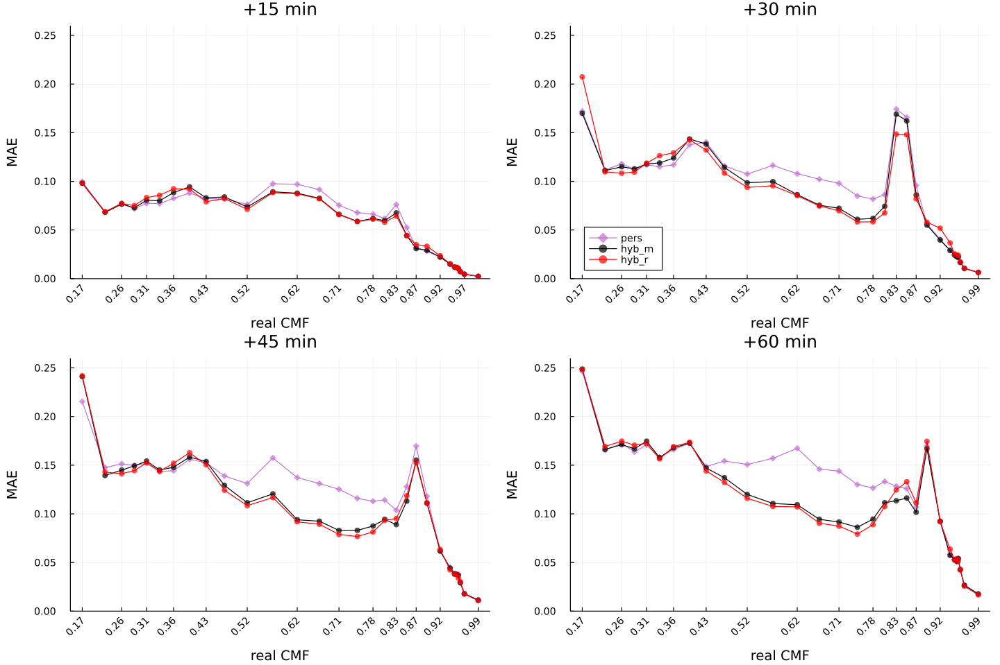

In [15]:
# newcolornew
maes = plot(mae1, mae2, mae3, mae4, layout=@layout([a b; c d]), size=(1200, 800), 
    leftmargin=20px, ylim=(0, 0.26))

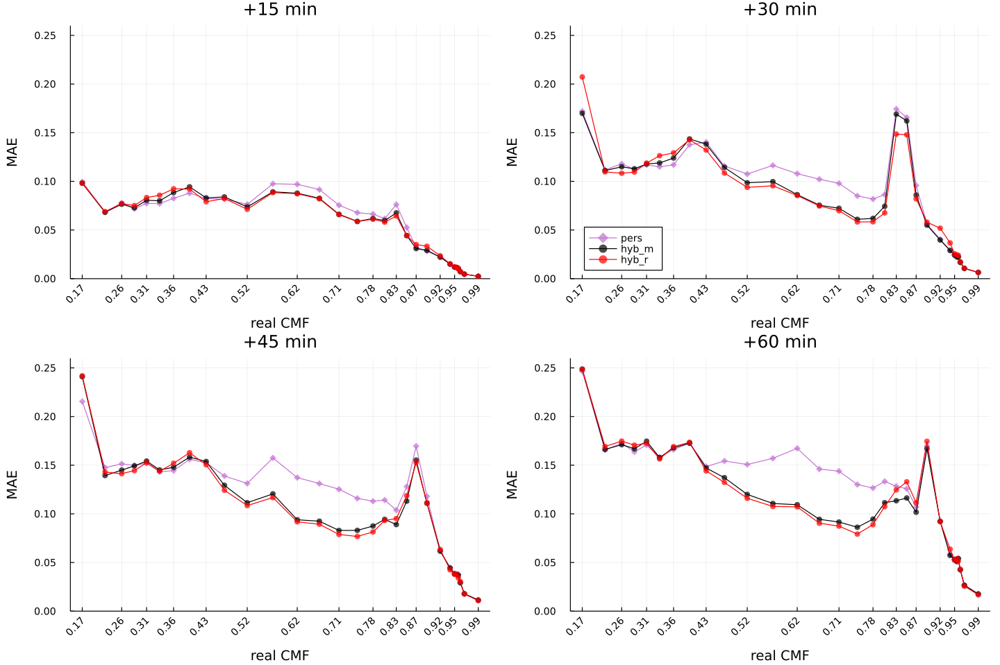

In [81]:
# newcolor
maes = plot(mae1, mae2, mae3, mae4, layout=@layout([a b; c d]), size=(1200, 800), 
    leftmargin=20px, ylim=(0, 0.26))

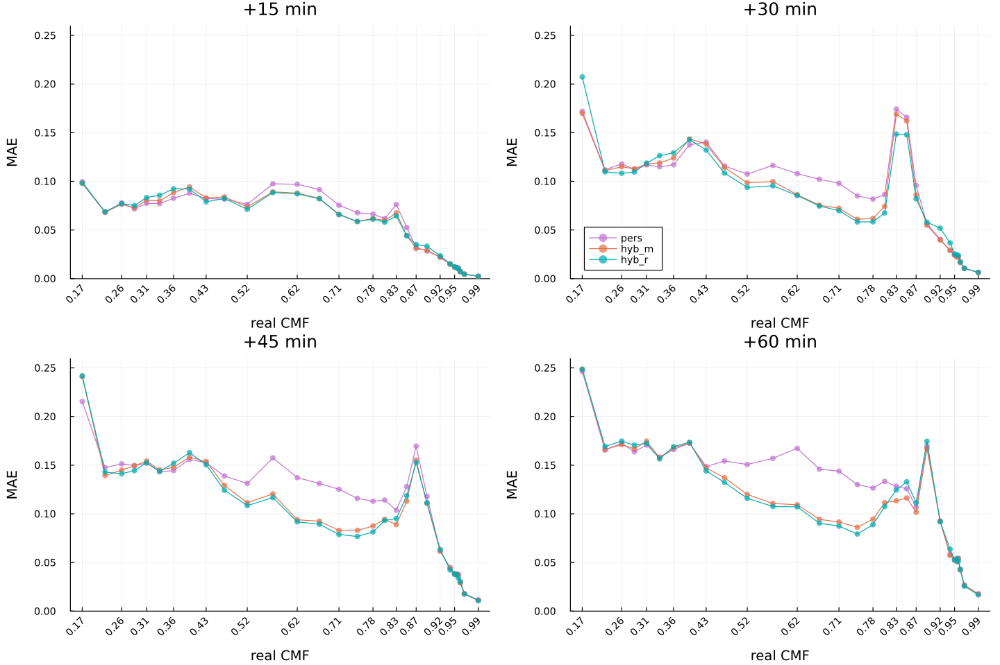

In [211]:
maes = plot(mae1, mae2, mae3, mae4, layout=@layout([a b; c d]), size=(1200, 800), 
    leftmargin=20px, ylim=(0, 0.26))

In [221]:
rmse1 = viz_err1(df1t, binMean, xti; tit="+$(15*1) min", err="rmse")
rmse2 = viz_err1(df2t, binMean, xti; tit="+$(15*2) min", err="rmse")
rmse3 = viz_err1(df3t, binMean, xti; tit="+$(15*3) min", err="rmse")
rmse4 = viz_err1(df4t, binMean, xti; tit="+$(15*4) min", err="rmse");

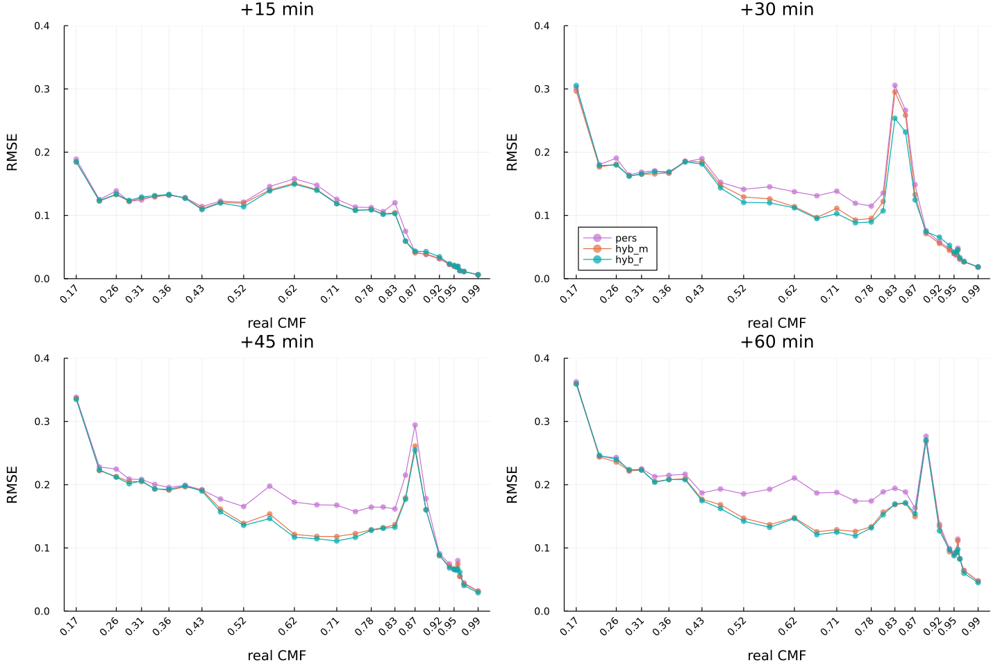

In [222]:
rmses = plot(rmse1, rmse2, rmse3, rmse4, layout=@layout([a b; c d]), size=(1200, 800), 
    leftmargin=20px, ylim=(0, 0.4))

### scatter
corr, R² etc

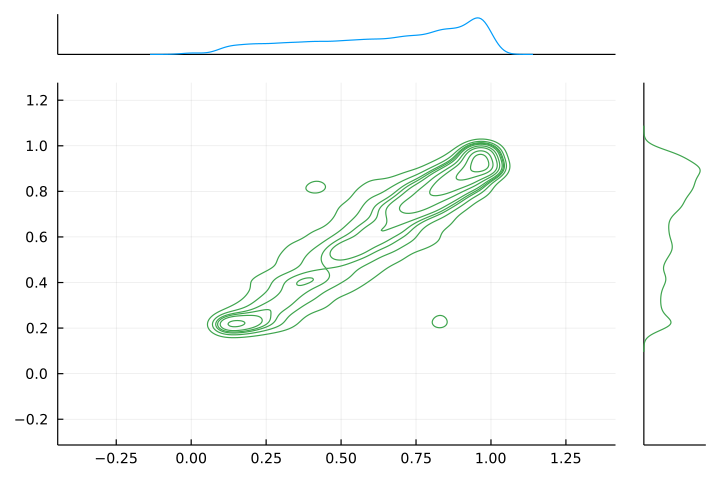

In [52]:
marginalkde(df2t.real, df2t.pred, c=[3 1], xlim=(0,1))

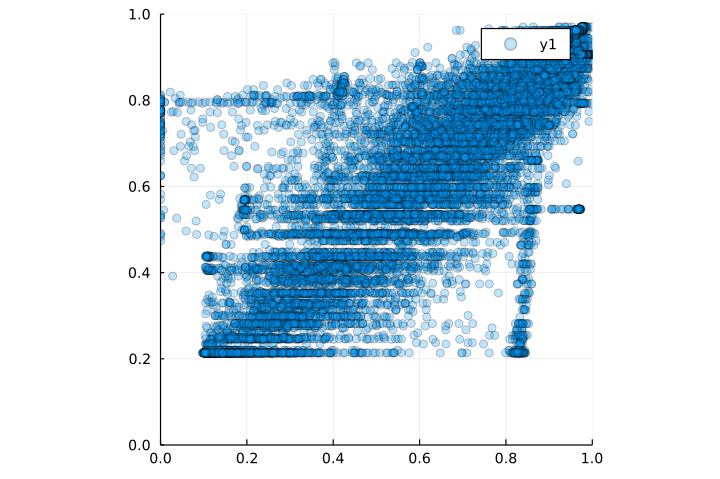

In [56]:
scatter(df2t.real, df2t.pred, alpha=0.25, 
    xlim=(0,1), ylim=(0,1), aspect_ratio=1)

In [83]:
function calc_cor(df, steps)
    cor_pers = cor(df.real, df.pers)
    cor_pred = cor(df.real, df.pred)
    cor_neib = cor(df.real, df.neib)
    cor_hyb_m = cor(df.real, df.hyb_m)
    cor_hyb_r = cor(df.real, df.hyb_r)
    if steps == 1
        cors = [cor_pers, cor_pred, NaN, cor_neib, cor_hyb_m, cor_hyb_r]
    else
        cor_pred_n = cor(df.real, df.pred_n)
        cors = [cor_pers, cor_pred, cor_pred_n, cor_neib, cor_hyb_m, cor_hyb_r]
    end
    return rd.(cors, 4)
end

calc_cor (generic function with 2 methods)

In [84]:
df_cor = DataFrame(:ways => ["pers", "pred_a", "pred_b", "neib", "hyb_m", "hyb_r"])
df_cor."+1" = calc_cor(df1t, 1)
df_cor."+2" = calc_cor(df2t, 2)
df_cor."+3" = calc_cor(df3t, 3)
df_cor."+4" = calc_cor(df4t, 4)
df_cor

,ways,+1,+2,+3,+4
,String,Float64,Float64,Float64,Float64
1,pers,0.9087,0.8142,0.7635,0.7275
2,pred_a,0.914,0.8204,0.7658,0.7254
3,pred_b,NaN,0.7956,0.72,0.6691
4,neib,0.8874,0.805,0.7653,0.7331
5,hyb_m,0.9143,0.8301,0.7946,0.7628
6,hyb_r,0.9146,0.8352,0.7975,0.7609


### CMF -> GHI

In [27]:
df1g = getGHI(df1t, 1)
df2g = getGHI(df2t, 2);

In [23]:
df2t[300,:]

,time,month,ghi,ghiCS,real,pers,neib,pred,pred_n,dif_pred_n,real_cls,dif_pers,dif_neib,dif_pred,mae_min,hyb_m,rmse_min,hyb_r,dif_hyb_m,dif_hyb_r
,DateTime,Int8,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Int64,Float64,Float64,Float64,Int64,Float64,Int64,Float64,Float64,Float64
300,2020-01-11T09:15:00,1,7.61737,40.224,0.189374,0.262992,0.215504,0.300579,0.35264,0.163267,1,0.073618,0.0261307,0.111205,1,0.262992,1,0.262992,0.073618,0.073618


In [25]:
dfg = df2g[1:300, :]

ghi = dfg.ghi
ghi_hyb_m = dfg.ghi_hyb_m
ghi_hyb_r = dfg.ghi_hyb_r;

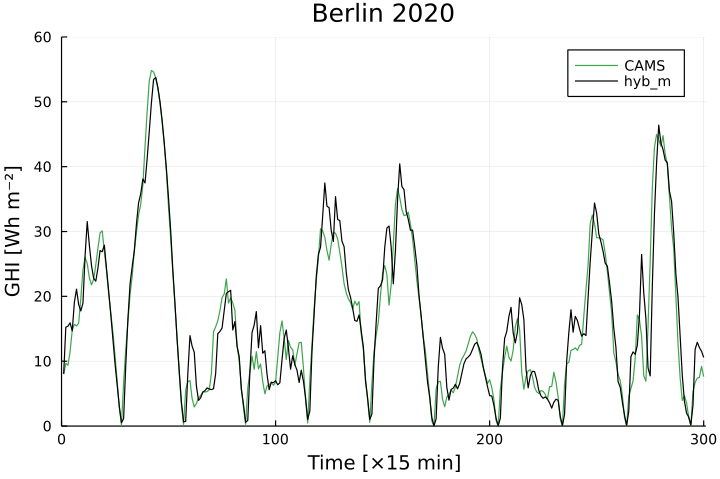

In [28]:
pg_d = plot([ghi ghi_hyb_m], c=[3 "black"], label=["CAMS" "hyb_m"], 
    xlim=(0,301), ylim=(0,60),
    xlabel="Time [×15 min]", ylabel="GHI [Wh m⁻²]", title=city*" 2020")

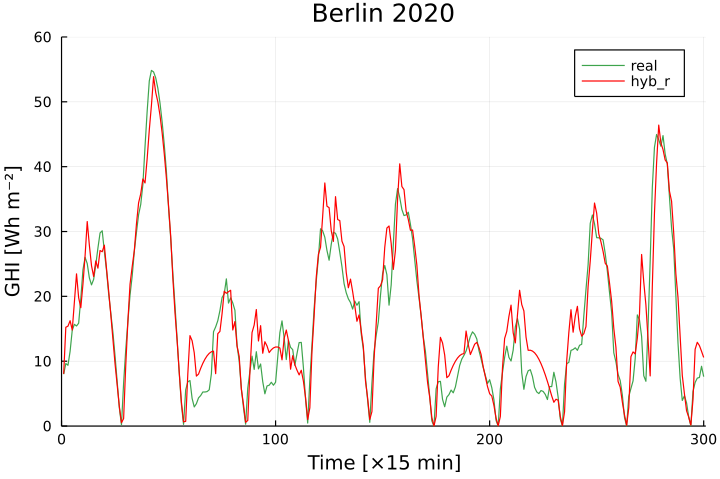

In [26]:
pg_d = plot([ghi ghi_hyb_r], c=[3 "red"], label=["CAMS" "hyb_r"], 
    xlim=(0,301), ylim=(0,60),
    xlabel="Time [×15 min]", ylabel="GHI [Wh m⁻²]", title=city*" 2020")

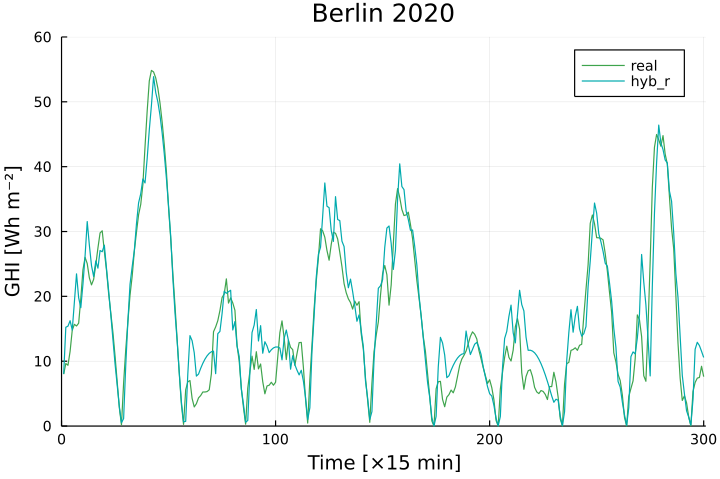

In [20]:
pg_d = plot([ghi ghi_hyb_r], c=[3 "red"], label=["real" "hyb_r"], 
    xlim=(0,301), ylim=(0,60),
    xlabel="Time [×15 min]", ylabel="GHI [Wh m⁻²]", title=city*" 2020")

In [29]:
gb = groupby(df2g, :month)
ghi = [mean(g.ghi) for g in gb]
ghi_hyb_r = [mean(g.ghi_hyb_r) for g in gb];

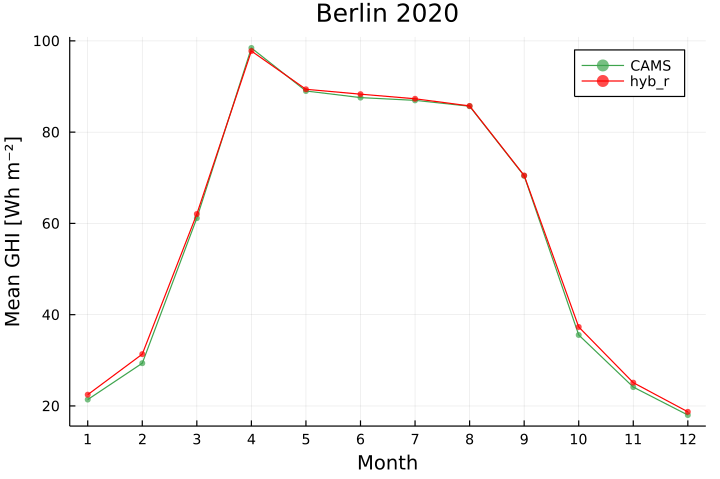

In [45]:
pg_m = plot([ghi ghi_hyb_r], c=[3 "red"], label=["CAMS" "hyb_r"], marker=(3, 0.7, stroke(0)),
    xticks=1:12, xlabel="Month", ylabel="Mean GHI [Wh m⁻²]", title=city*" 2020")

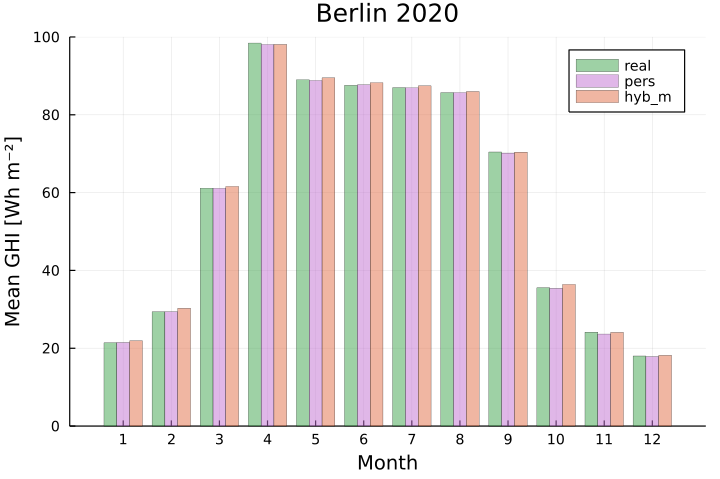

In [239]:
gb = groupby(df2g, :month)
ghi = [mean(g.ghi) for g in gb]
ghi_pers = [mean(g.ghi_pers) for g in gb]
ghi_hyb_m = [mean(g.ghi_hyb_m) for g in gb];

gb2 = groupedbar(1:12, [ghi ghi_pers ghi_hyb_m], lw=0.2, fillalpha=0.5, 
    c=[3 4 2], label=["real" "pers" "hyb_m"], ylim=(0, 100),
    xticks=1:12, xlabel="Month", ylabel="Mean GHI [Wh m⁻²]", title=city*" 2020")

In [28]:
df3g = getGHI(df3t, 3)
df4g = getGHI(df4t, 4);

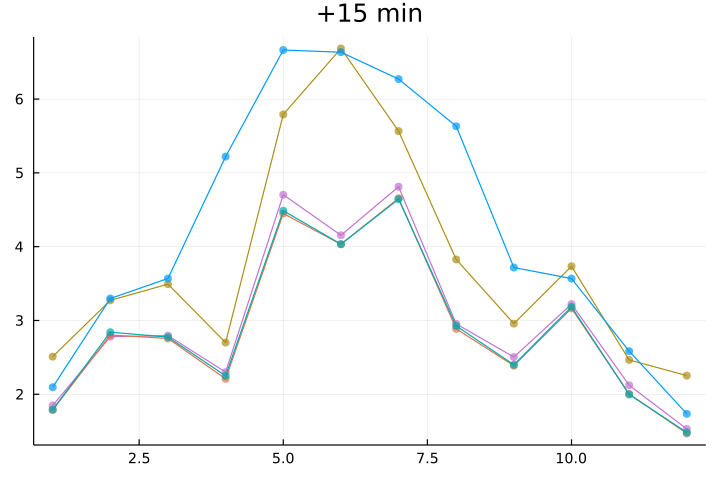

In [22]:
pg1 = viz_ghi_err(df1g, 1; tit="+$(15*1) min")

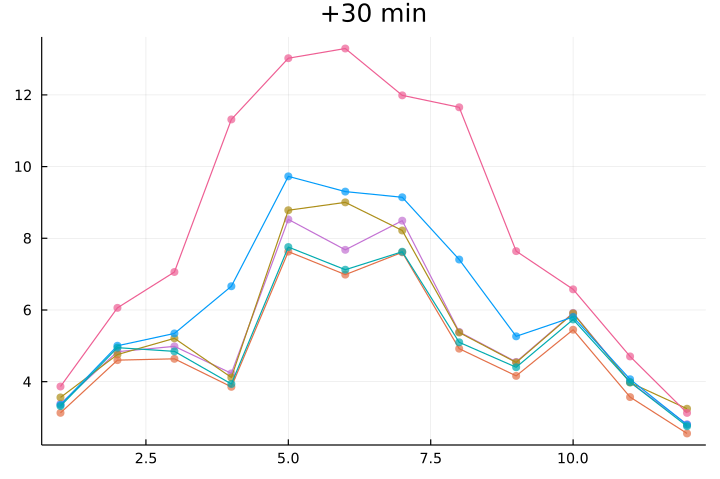

In [23]:
pg2 = viz_ghi_err(df2g, 2; tit="+$(15*2) min")

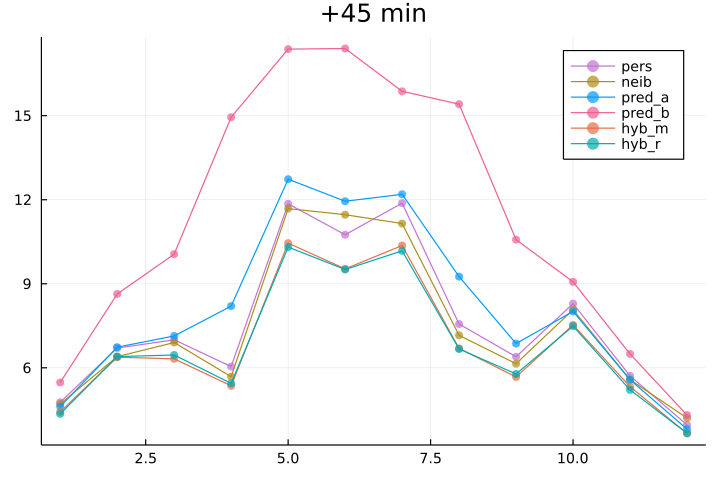

In [24]:
pg3 = viz_ghi_err(df3g, 3; tit="+$(15*3) min")

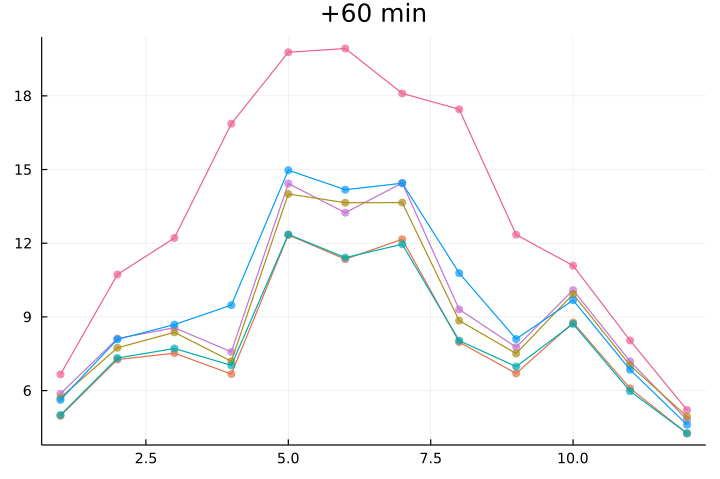

In [26]:
pg4 = viz_ghi_err(df4g, 4; tit="+$(15*4) min")

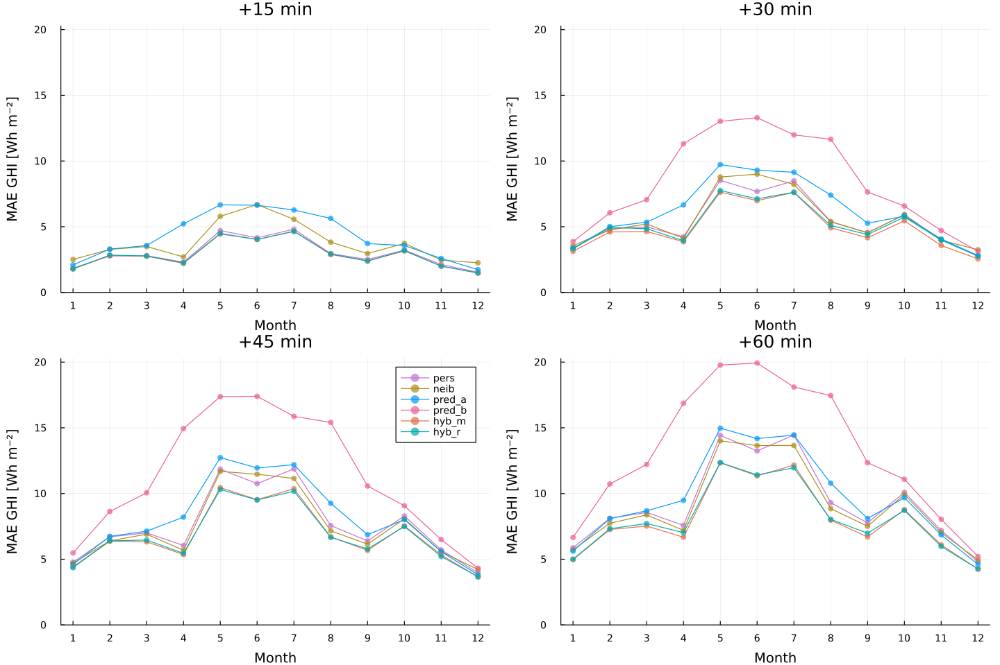

In [30]:
ps_ghi_mae = plot(pg1, pg2, pg3, pg4, layout=@layout([a b; c d]), leftmargin=20px, size=(1200, 800), ylim=(0,20.3),
    xtick=1:12, xlabel="Month", ylabel="MAE GHI [Wh m⁻²]")

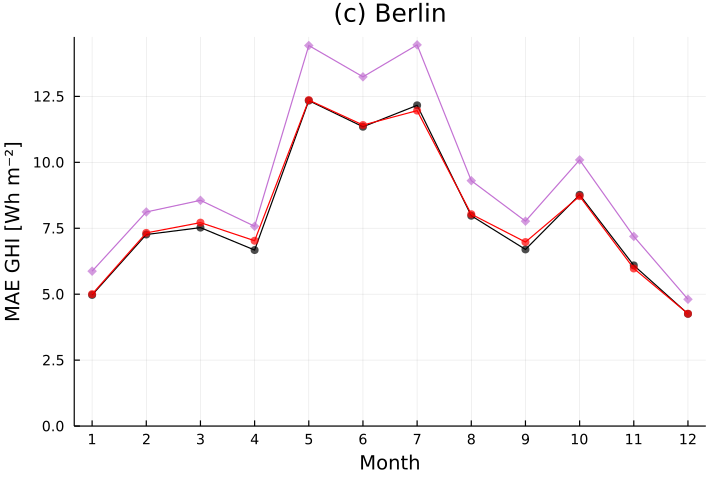

In [20]:
pg4 = viz_ghi_err(df4g, 4; tit="(c) "*city)

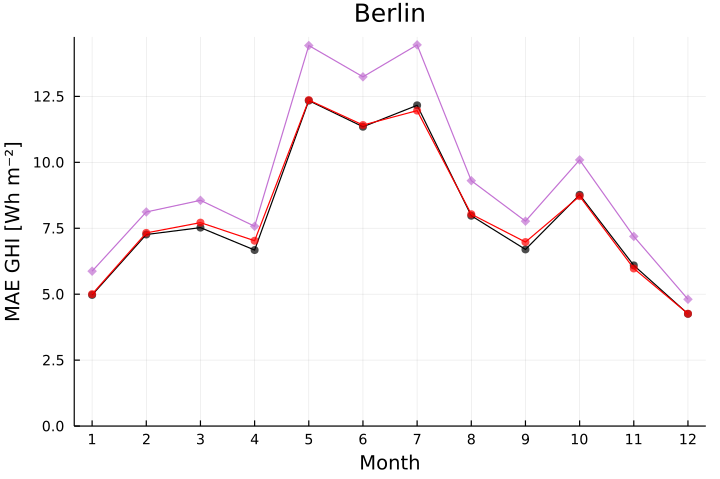

In [19]:
pg4 = viz_ghi_err(df4g, 4; tit="(c) "*city)

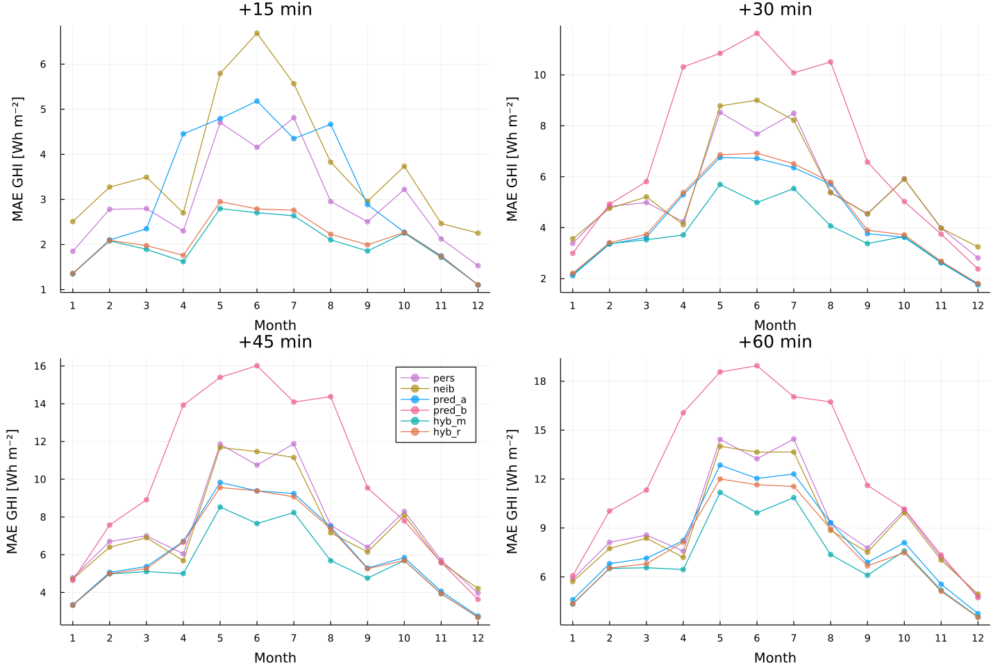

In [40]:
ps_ghi_mae = plot(pg1, pg2, pg3, pg4, layout=@layout([a b; c d]), leftmargin=20px, size=(1200, 800), 
    xtick=1:12, xlabel="Month", ylabel="MAE GHI [Wh m⁻²]")

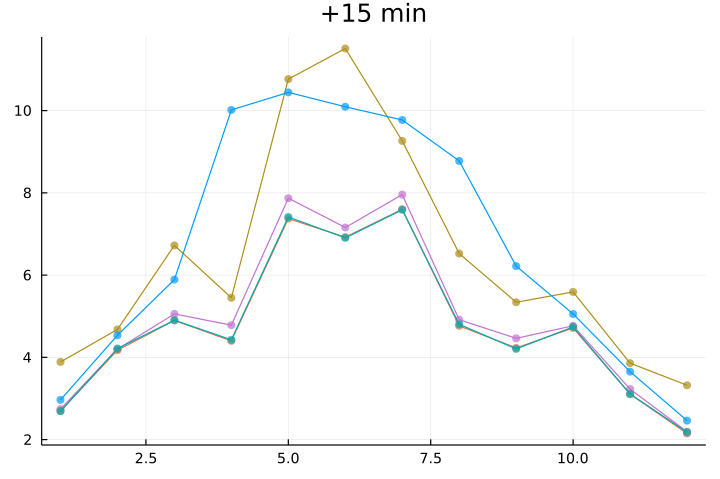

In [33]:
pgr1 = viz_ghi_err(df1g, 1; tit="+$(15*1) min", err="rmse")

In [34]:
pgr2 = viz_ghi_err(df2g, 2; tit="+$(15*2) min", err="rmse")
pgr3 = viz_ghi_err(df3g, 3; tit="+$(15*3) min", err="rmse")
pgr4 = viz_ghi_err(df4g, 4; tit="+$(15*4) min", err="rmse");

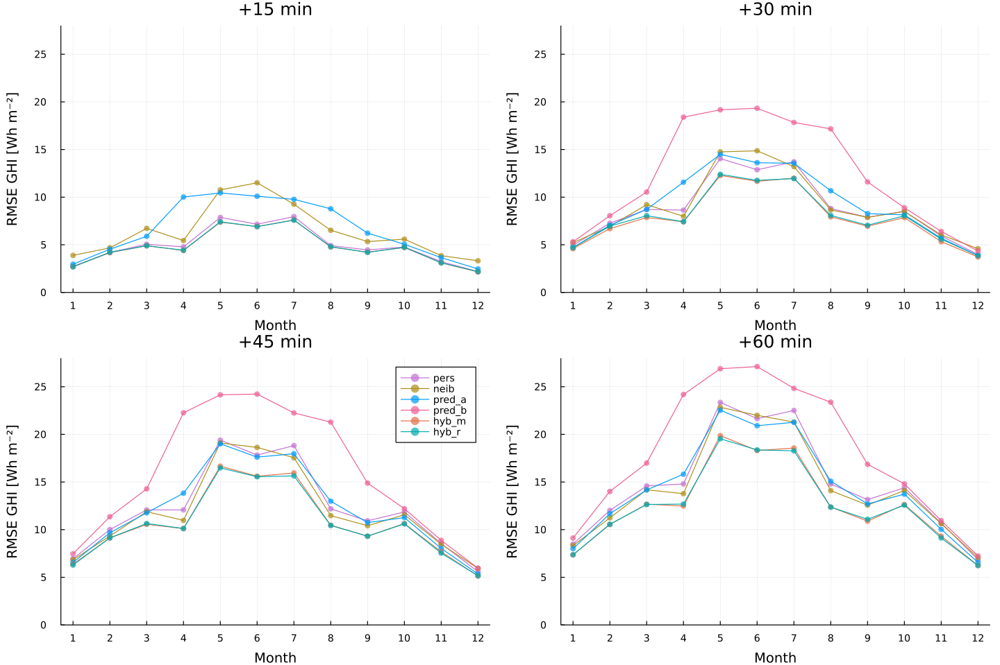

In [36]:
ps_ghi_rmse = plot(pgr1, pgr2, pgr3, pgr4, layout=@layout([a b; c d]), leftmargin=20px, size=(1200, 800), ylim=(0,28),
    xtick=1:12, xlabel="Month", ylabel="RMSE GHI [Wh m⁻²]")

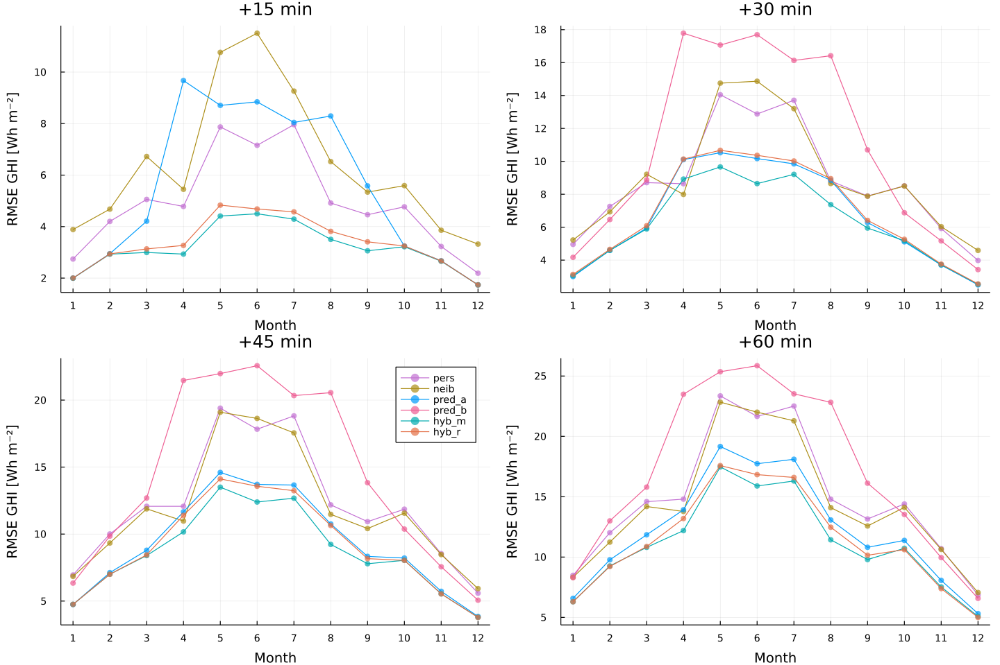

In [52]:
ps_ghi_rmse = plot(pgr1, pgr2, pgr3, pgr4, layout=@layout([a b; c d]), leftmargin=20px, size=(1200, 800), 
    xtick=1:12, xlabel="Month", ylabel="RMSE GHI [Wh m⁻²]")

#### rel. improvement

In [29]:
rDif1 = rDif(df1g)
rDif2 = rDif(df2g)
rDif3 = rDif(df3g)
rDif4 = rDif(df4g);

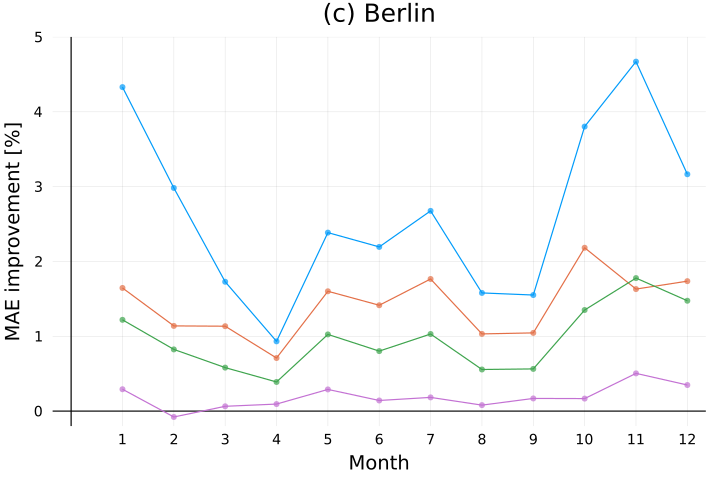

In [30]:
pRdif_m = plot([rDif4 rDif3 rDif2 rDif1], marker=(3, 0.7, stroke(0)), frame=:zerolines, 
    ylim=(-0.2, 5), label=["+60 min" "+45 min" "+30 min" "+15 min"], leg=:none, #:outerbottomright, 
    xticks=1:12, xlabel="Month", ylabel="MAE improvement [%]", title="(c) "*city)

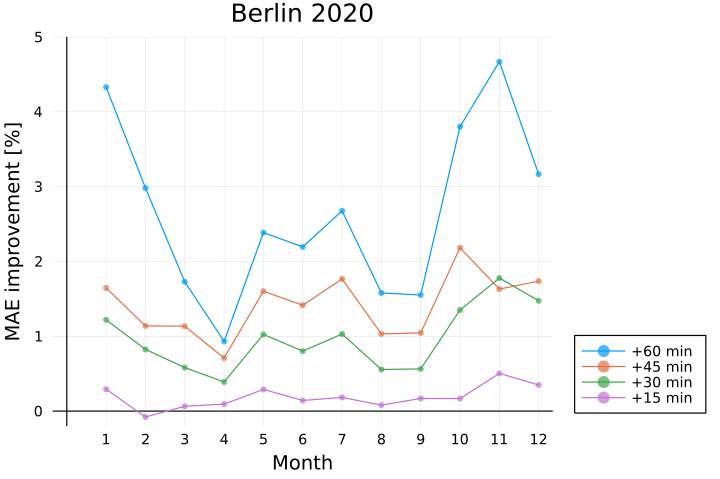

In [80]:
pRdif_m = plot([rDif4 rDif3 rDif2 rDif1], marker=(3, 0.7, stroke(0)), frame=:zerolines, 
    ylim=(-0.2, 5), label=["+60 min" "+45 min" "+30 min" "+15 min"], leg=:outerbottomright, 
    xticks=1:12, xlabel="Month", ylabel="MAE improvement [%]", title=city*" 2020")

In [81]:
rDif1r = rDif(df1g; err="rmse")
rDif2r = rDif(df2g; err="rmse")
rDif3r = rDif(df3g; err="rmse")
rDif4r = rDif(df4g; err="rmse");

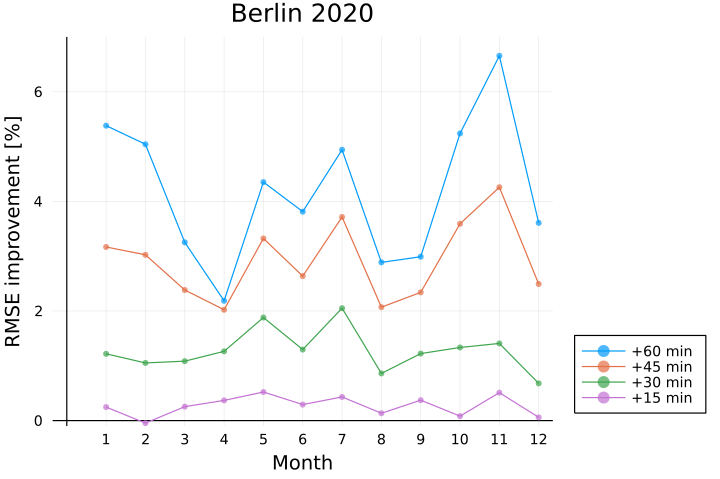

In [82]:
pRdif_r = plot([rDif4r rDif3r rDif2r rDif1r], marker=(3, 0.7, stroke(0)), frame=:zerolines, 
    ylim=(-0.1,7), label=["+60 min" "+45 min" "+30 min" "+15 min"], leg=:outerbottomright, 
    xticks=1:12, xlabel="Month", ylabel="RMSE improvement [%]", title=city*" 2020")